In [1]:
import pickle
import json
import os
import sys
from copy import deepcopy
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import skimage
import tifffile
import yaml
from einops import rearrange, repeat

In [2]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42

In [3]:
%load_ext autoreload

In [4]:
%autoreload 2

In [5]:
from mushroom.mushroom import Mushroom, DEFAULT_CONFIG
import mushroom.utils as utils
import mushroom.visualization.utils as vis_utils
import mushroom.data.multiplex as multiplex
import mushroom.data.visium as visium
import mushroom.data.xenium as xenium
import mushroom.data.cosmx as cosmx

In [6]:
source_root = '/diskmnt/Projects/Users/estorrs/mushroom/data'
target_root = '/data/estorrs/mushroom/data'

In [7]:
run_dir = '/data/estorrs/mushroom/data/projects/submission_v1'

In [8]:
def alter_filesystem(config, source_root, target_root):
    for entry in config['sections']:
        for mapping in entry['data']:
            mapping['filepath'] = mapping['filepath'].replace(source_root, target_root)
        
    return config

In [9]:
case = 'HT704B1'
# case = 'HT206B1'
# case = 'HT397B1'
# case = 'HT413C1-Th1k4A1'

In [10]:
project_dir = f'/data/estorrs/mushroom/data/projects/submission_v1/{case}'

In [11]:
config = yaml.safe_load(open(os.path.join(project_dir, 'registered', 'metadata.yaml')))
config = alter_filesystem(config, source_root, target_root)
config

{'resolution': 1.0,
 'sections': [{'data': [{'dtype': 'xenium',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/registered/s0_HT704B1-U1_xenium.h5ad'}],
   'position': 0,
   'sid': 'HT704B1-U1'},
  {'data': [{'dtype': 'multiplex',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/registered/s1_HT704B1-U11_multiplex.ome.tiff'}],
   'position': 50,
   'sid': 'HT704B1-U11'},
  {'data': [{'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/registered/s2_HT704B1-U12_he.tif'}],
   'position': 55,
   'sid': 'HT704B1-U12'},
  {'data': [{'dtype': 'cosmx',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/registered/s3_HT704B1-U14_cosmx.h5ad'}],
   'position': 65,
   'sid': 'HT704B1-U14'},
  {'data': [{'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/registered/s4_HT704B1-U15_he.tif'}],
   'position': 70,
   'sid': 'HT704B1-U15'},
 

write quick view image stack

In [12]:
multiplex_view_settings = [
    {
        'channel': 'E-cadherin',
        'color': 'red',
        'min_value': 15,
        'max_value': 100,
        'gamma': 1.
    },
    {
        'channel': 'HLA-DR',
        'color': 'magenta',
        'min_value': 15,
        'max_value': 255,
        'gamma': 1.
    },
    {
        'channel': 'Keratin 5',
        'color': 'white',
        'min_value': 15,
        'max_value': 255,
        'gamma': 1.
    },
    {
        'channel': 'CD3e',
        'color': 'green',
        'min_value': 20,
        'max_value': 75,
        'gamma': 1.
    },
    {
        'channel': 'CD68',
        'color': 'cyan',
        'min_value': 15,
        'max_value': 255,
        'gamma': 1.
    },
]

def get_multiplex_pseudo(fp, view_settings):
    channels = [x['channel'] for x in view_settings]
    colors = [x['color'] for x in view_settings]
    min_values = [x['min_value'] for x in view_settings]
    max_values = [x['max_value'] for x in view_settings]
    gammas = [x['gamma'] for x in view_settings]
    
    channel_to_img = multiplex.extract_ome_tiff(fp, as_dict=True)
    data = np.stack([channel_to_img[x] for x in channels])
    
    rgb = multiplex.to_pseudocolor(
        data,
        colors=colors,
        min_values=min_values,
        max_values=max_values,
        gammas=gammas
    )
    
    rgb *= 255.
    rgb = rgb.astype(np.uint8)
    
    return rgb

In [13]:
xenium_view_settings = [
    {
        'channel': 'EPCAM',
        'color': 'red',
        'min_value': 0,
        'max_value': 20,
        'gamma': 1.
    },
    {
        'channel': 'HLA-DQB2',
        'color': 'magenta',
        'min_value': 0,
        'max_value': 50,
        'gamma': 1.
    },
    {
        'channel': 'KRT5',
        'color': 'white',
        'min_value': 0,
        'max_value': 20,
        'gamma': 1.
    },
    {
        'channel': 'CD3E',
        'color': 'green',
        'min_value': 0,
        'max_value': 50,
        'gamma': 1.
    },
    {
        'channel': 'CD68',
        'color': 'cyan',
        'min_value': 0,
        'max_value': 50,
        'gamma': 1.
    },
]

def tile_xenium(adata, target_size=None, tile_size=20):
    if target_size is None:
        target_size = xenium.get_fullres_size(adata)
    
    adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]
    df = pd.DataFrame(data=adata.X, columns=adata.var.index.to_list(), index=adata.obs.index.to_list())
    df['grid_name'] = adata.obs['grid_name'].to_list()
    df = df.groupby('grid_name').sum()
    
    img = np.zeros((target_size[0] // tile_size + 1, target_size[1] // tile_size + 1, df.shape[1]))
    for name, row in df.iterrows():
        x, y = [int(x) for x in name.split('_')]
        img[y, x] = row.values
    return img
    

def get_xenium_pseudo(fp, view_settings, tile_size=20, target_size=None):
    channels = [x['channel'] for x in view_settings]
    colors = [x['color'] for x in view_settings]
    min_values = [x['min_value'] for x in view_settings]
    max_values = [x['max_value'] for x in view_settings]
    gammas = [x['gamma'] for x in view_settings]
    
    adata = xenium.adata_from_xenium(fp)
    if target_size is None:
        target_size = xenium.get_fullres_size(adata)
    
    img = tile_xenium(adata, tile_size=tile_size)
    
    data = img[..., [adata.var.index.to_list().index(x) for x in channels]]
    data -= data.min((0, 1))
    data /= data.max((0, 1))
    data *= 255.
    data = data.astype(np.uint8)
    data = rearrange(data, 'h w c -> c h w')
    
    rgb = multiplex.to_pseudocolor(
        data,
        colors=colors,
        min_values=min_values,
        max_values=max_values,
        gammas=gammas
    )
    rgb = utils.rescale(rgb, size=target_size, dim_order='h w c', target_dtype=rgb.dtype)
    
    rgb *= 255.
    rgb = rgb.astype(np.uint8)
#     plt.imshow(rgb[4000:4500, 4000:4500])
#     plt.show()
    
    return rgb

In [73]:
imaris_rgb_dir = Path(os.path.join(project_dir, 'imaris', 'pseudos_rgb'))
pseudo_rgb_dir = Path(os.path.join(project_dir, 'pseudos', 'pseudos_rgb'))
imaris_rgb_dir.mkdir(parents=True, exist_ok=True)
pseudo_rgb_dir.mkdir(parents=True, exist_ok=True)

target_size = (7250, 9060) # specifying here because xenium calculation is a few pixels off
rgbs = []
for i, section in enumerate(config['sections']):
    print(i, section['sid'])
    sid = section['sid']
    entry = section['data'][0]
    dtype = entry['dtype']
    fp = entry['filepath']
    position = section['position']
    
    if dtype == 'he': 
        rgb = tifffile.imread(fp)
    elif dtype == 'xenium':
        rgb = get_xenium_pseudo(
            fp,
            xenium_view_settings,
            tile_size=10,
            target_size=target_size,
        )
    elif dtype == 'multiplex':
        rgb = get_multiplex_pseudo(
            fp,
            multiplex_view_settings
        )
    else:
        rgb = None
        
    
    if rgb is not None:
#         print(rgb.max((0, 1)))
#         plt.imshow(rgb)
#         plt.show()
        rgbs.append(rgb)
        tifffile.imwrite(pseudo_rgb_dir / f's{i}_{sid}.tif', rgb, compression='LZW', ome=True, bigtiff=True)
        tifffile.imwrite(imaris_rgb_dir / f'case_Z{position}.tif', rgb)
#     break

0 HT704B1-U1


FileNotFoundError: [Errno 2] No such file or directory: '/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/pseudos/pseudos_rgb/s0_HT704B1-U1.tif'

In [52]:
data = np.stack(rgbs)
data.shape, data.dtype

((38, 7250, 9060, 3), dtype('uint8'))

In [53]:
from ome_types import model, to_xml
dtype_name = str(np.dtype(data.dtype))
if 'int' in dtype_name:
    assert dtype_name in ['int8', 'int16', 'int32', 'uint8', 'uint16', 'uint32']
elif 'float' in dtype_name:
    dtype_name = 'float'
elif dtype_name == 'bool':
    dtype_name = 'bit'
else:
    raise ValueError(f'dtype {data.dtype} was unable to be saved as ome')

o = model.OME()
o.images.append(
    model.Image(
        id='Image:0',
        pixels=model.Pixels(
            dimension_order='XYCZT',
            size_c=data.shape[3],
            size_t=1,
            size_x=data.shape[2],
            size_y=data.shape[1],
            size_z=data.shape[0],
            type=dtype_name,
            big_endian=False,
            channels=[model.Channel(id=f'Channel:{i}', name=c) for i, c in enumerate(['red', 'green', 'blue'])],
            physical_size_x=1.,
            physical_size_y=1.,
            physical_size_z=1.,
            physical_size_x_unit='µm',
            physical_size_y_unit='µm',
            physical_size_z_unit='µm'
        )
    )
)

im = o.images[0]
for i in range(len(im.pixels.channels)):
    for j in range(data.shape[0]):
        im.pixels.planes.append(model.Plane(the_c=i, the_t=0, the_z=j))
im.pixels.tiff_data_blocks.append(model.TiffData(plane_count=len(im.pixels.planes)))

filepath = '/data/estorrs/sandbox/test.ome.tif'
with tifffile.TiffWriter(filepath, ome=True, bigtiff=True) as out_tif:
    opts = {
        'compression': 'LZW',
    }
    out_tif.write(
        rearrange(data, 'z y x c -> 1 z c y x'),
        **opts
    )
    xml_str = to_xml(o)
    out_tif.overwrite_description(xml_str.encode())

In [54]:
from einops import rearrange
def write_imaris(config, dtype='multiplex', channel_names=None, tiling_size=20, drop=None, dir_name='imaris'):
    sections = [x for x in config['sections'] if x['data'][0]['dtype']==dtype]
    
    if drop is not None:
        sections = [x for x in sections if x['sid'] not in drop]
    
    print([x['sid'] for x in sections])
    
    fps = [x['data'][0]['filepath'] for x in sections]
    
    if dtype == 'multiplex':
        channels = multiplex.get_common_channels(fps)
    elif dtype == 'xenium':
        channels = xenium.get_common_channels(fps)
    elif dtype == 'visium':
        channels = visium.get_common_channels(fps)
    elif dtype == 'cosmx':
        channels = cosmx.get_common_channels(fps)
    else:
        raise ValueError(f'{dtype} is not valid dtype')
        
    if channel_names is not None:
        present = [channel for channel in channel_names if channel in channels]
        assert len(present) == len(channel_names), f'{set(channel_names) - set(present)} not in all images'
        channels = channel_names
    print(channels)

    imgs = []
    target_size = None
    for fp in fps:
        if dtype == 'multiplex':
            channel_to_img = multiplex.extract_ome_tiff(fp, channels=channels, as_dict=True)
            img = np.stack([channel_to_img[c] for c in channels])
        elif dtype == 'xenium':
            adata = xenium.adata_from_xenium(fp, normalize=True)
            adata = adata[:, channels]
            img = xenium.to_multiplex(adata, tiling_size=tiling_size, method='grid')
            img = rearrange(img, 'h w c -> c h w')
        elif dtype == 'visium':
            adata = visium.adata_from_visium(fp, normalize=True)
            adata = adata[:, channels]
            img = visium.to_multiplex(adata, tiling_size=tiling_size, method='radius')
            img = rearrange(img, 'h w c -> c h w')
        elif dtype == 'cosmx':
            adata = cosmx.adata_from_cosmx(fp, normalize=True)
            adata = adata[:, channels]
            img = xenium.to_multiplex(adata, tiling_size=tiling_size, method='grid')
            img = rearrange(img, 'h w c -> c h w')
        if target_size is None:
            target_size = img.shape[-2:]
        
        if img.shape[-2:] != target_size:
            img = utils.rescale(img, size=target_size, target_dtype=img.dtype, dim_order='c h w')
        
        print(img.shape)
        imgs.append(img)
    x = np.stack(imgs)
    print(x.shape, x.dtype)
    
    if x.dtype != np.uint8:
        x = x - x.min((0, 2, 3), keepdims=True)
        x = x / x.max((0, 2, 3), keepdims=True)
        x = x * 255
        x = x.astype(np.uint8)
    
    directory = Path(os.path.join(project_dir, dir_name, dtype))
    directory.mkdir(parents=True, exist_ok=True)
    for c in range(x.shape[1]):
        print(c, channels[c])
        filepath = directory / f'{case}_C{c}.tif'
        with tifffile.TiffWriter(filepath, bigtiff=True) as tif:
            metadata={
                'axes': 'XYZCT',
                'PhysicalSizeX': config['resolution'],
                'PhysicalSizeXUnit': 'µm',
                'PhysicalSizeY': config['resolution'],
                'PhysicalSizeYUnit': 'µm',
            }
            tif.write(
                rearrange(x[:, c], 'z h w -> 1 1 z h w'),
                metadata=metadata,
                compression='LZW',
            )
    meta = {
        'channels': [f'{i}_{x}' for i, x in enumerate(channels)],
        'sections': [entry['sid'] for entry in sections]
    }
    yaml.safe_dump(meta, open(directory / 'metadata.yaml', 'w'))
    
    del(img)
    
    
    

In [13]:
# drop = ['HT704B1-U43', 'HT704B1-U53', 'HT704B1-U91']
write_imaris(config, dtype='multiplex')

['HT704B1-U11', 'HT704B1-U19', 'HT704B1-U27', 'HT704B1-U35', 'HT704B1-U43', 'HT704B1-U53', 'HT704B1-U60', 'HT704B1-U68', 'HT704B1-U76', 'HT704B1-U82', 'HT704B1-U85', 'HT704B1-U91']
['BCA1', 'CD163', 'CD20', 'CD31', 'CD39', 'CD3e', 'CD4 (D)', 'CD45 (D)', 'CD68', 'CD8', 'CK14 (D)', 'COX6C (D)', 'CTLA4 (D)', 'DAPI', 'E-cadherin', 'FOXP3', 'GATA3', 'GLUT1 (D)', 'Granzyme B', 'HER2 (D)', 'HIF1a', 'HLA-DR', 'Keratin 5', 'Ki67', 'MGP (D)', 'MLPH', 'PD-1', 'PLAT/tPA (D)', 'PR (D)', 'Pan-Cytokeratin', 'Podoplanin (D)', 'SLC39A6 (D)', 'SMA (D)', 'TCF-1', 'TFF1 (D)', 'Vimentin', 'cd11b', 'ckit-(D)']
(38, 7250, 9060)
(38, 7250, 9060)
(38, 7250, 9060)
(38, 7250, 9060)
(38, 7250, 9060)
(38, 7250, 9060)
(38, 7250, 9060)
(38, 7250, 9060)
(38, 7250, 9060)
(38, 7250, 9060)
(38, 7250, 9060)
(38, 7250, 9060)
(12, 38, 7250, 9060) uint8
0 BCA1
1 CD163
2 CD20
3 CD31
4 CD39
5 CD3e
6 CD4 (D)
7 CD45 (D)
8 CD68
9 CD8
10 CK14 (D)
11 COX6C (D)
12 CTLA4 (D)
13 DAPI
14 E-cadherin
15 FOXP3
16 GATA3
17 GLUT1 (D)
18 Gr

In [14]:
write_imaris(config, dtype='visium', tiling_size=100)

['HT397B1-U1', 'HT397B1-U21']
['A1BG', 'A2M', 'A4GALT', 'AAAS', 'AACS', 'AADAT', 'AAGAB', 'AAK1', 'AAMDC', 'AAMP', 'AAR2', 'AARS', 'AARS2', 'AARSD1', 'AASDHPPT', 'AASS', 'AATF', 'ABAT', 'ABCA1', 'ABCA12', 'ABCA2', 'ABCA3', 'ABCA5', 'ABCA6', 'ABCA7', 'ABCA8', 'ABCA9', 'ABCB6', 'ABCB7', 'ABCB8', 'ABCB9', 'ABCC1', 'ABCC10', 'ABCC11', 'ABCC12', 'ABCC3', 'ABCC4', 'ABCC5', 'ABCC6', 'ABCC9', 'ABCD1', 'ABCD3', 'ABCD4', 'ABCE1', 'ABCF1', 'ABCF2', 'ABCF3', 'ABCG1', 'ABHD10', 'ABHD11', 'ABHD12', 'ABHD14A', 'ABHD14B', 'ABHD15', 'ABHD16A', 'ABHD17A', 'ABHD17B', 'ABHD17C', 'ABHD18', 'ABHD2', 'ABHD3', 'ABHD4', 'ABHD5', 'ABHD6', 'ABHD8', 'ABI1', 'ABI2', 'ABI3', 'ABI3BP', 'ABL1', 'ABL2', 'ABLIM1', 'ABLIM3', 'ABR', 'ABRACL', 'ABRAXAS1', 'ABRAXAS2', 'ABT1', 'ABTB1', 'ABTB2', 'AC015802.6', 'AC055839.2', 'AC073111.4', 'AC090360.1', 'AC093323.1', 'AC093512.2', 'AC118549.1', 'AC119396.1', 'ACAA1', 'ACAA2', 'ACACA', 'ACACB', 'ACAD10', 'ACAD11', 'ACAD8', 'ACAD9', 'ACADM', 'ACADS', 'ACADSB', 'ACADVL', 'ACAP1', 

(11622, 187, 184)
(11622, 187, 184)
(2, 11622, 187, 184) float64
0 A1BG
1 A2M
2 A4GALT
3 AAAS
4 AACS
5 AADAT
6 AAGAB
7 AAK1
8 AAMDC
9 AAMP
10 AAR2
11 AARS
12 AARS2
13 AARSD1
14 AASDHPPT
15 AASS
16 AATF
17 ABAT
18 ABCA1
19 ABCA12
20 ABCA2
21 ABCA3
22 ABCA5
23 ABCA6
24 ABCA7
25 ABCA8
26 ABCA9
27 ABCB6
28 ABCB7
29 ABCB8
30 ABCB9
31 ABCC1
32 ABCC10
33 ABCC11
34 ABCC12
35 ABCC3
36 ABCC4
37 ABCC5
38 ABCC6
39 ABCC9
40 ABCD1
41 ABCD3
42 ABCD4
43 ABCE1
44 ABCF1
45 ABCF2
46 ABCF3
47 ABCG1
48 ABHD10
49 ABHD11
50 ABHD12
51 ABHD14A
52 ABHD14B
53 ABHD15
54 ABHD16A
55 ABHD17A
56 ABHD17B
57 ABHD17C
58 ABHD18
59 ABHD2
60 ABHD3
61 ABHD4
62 ABHD5
63 ABHD6
64 ABHD8
65 ABI1
66 ABI2
67 ABI3
68 ABI3BP
69 ABL1
70 ABL2
71 ABLIM1
72 ABLIM3
73 ABR
74 ABRACL
75 ABRAXAS1
76 ABRAXAS2
77 ABT1
78 ABTB1
79 ABTB2
80 AC015802.6
81 AC055839.2
82 AC073111.4
83 AC090360.1
84 AC093323.1
85 AC093512.2
86 AC118549.1
87 AC119396.1
88 ACAA1
89 ACAA2
90 ACACA
91 ACACB
92 ACAD10
93 ACAD11
94 ACAD8
95 ACAD9
96 ACADM
97 ACADS
98 AC

786 ATP1A1
787 ATP1B1
788 ATP23
789 ATP2A2
790 ATP2A3
791 ATP2B1
792 ATP2B4
793 ATP2C1
794 ATP2C2
795 ATP5F1A
796 ATP5F1B
797 ATP5F1D
798 ATP5F1E
799 ATP5IF1
800 ATP5MC2
801 ATP5MC3
802 ATP5ME
803 ATP5MF
804 ATP5MG
805 ATP5MPL
806 ATP5PB
807 ATP5PD
808 ATP5PF
809 ATP6AP1
810 ATP6AP1L
811 ATP6AP2
812 ATP6V0A1
813 ATP6V0B
814 ATP6V0D1
815 ATP6V0E1
816 ATP6V0E2
817 ATP6V1A
818 ATP6V1B2
819 ATP6V1C1
820 ATP6V1C2
821 ATP6V1D
822 ATP6V1E1
823 ATP6V1E2
824 ATP6V1F
825 ATP6V1G1
826 ATP6V1H
827 ATP7A
828 ATP7B
829 ATP8A1
830 ATP8B1
831 ATP8B2
832 ATP9A
833 ATP9B
834 ATPAF1
835 ATPAF2
836 ATPSCKMT
837 ATR
838 ATRAID
839 ATRIP
840 ATRN
841 ATRX
842 ATXN1
843 ATXN10
844 ATXN1L
845 ATXN2
846 ATXN2L
847 ATXN3
848 ATXN7
849 ATXN7L1
850 ATXN7L2
851 ATXN7L3
852 ATXN7L3B
853 AUH
854 AUNIP
855 AUP1
856 AURKA
857 AURKAIP1
858 AURKB
859 AUTS2
860 AVEN
861 AVIL
862 AVL9
863 AXIN1
864 AXIN2
865 AXL
866 AZGP1
867 AZI2
868 AZIN1
869 AZIN2
870 B2M
871 B3GALNT1
872 B3GALNT2
873 B3GALT4
874 B3GALT5
875 B3GALT6
87

1592 CD2BP2
1593 CD300A
1594 CD302
1595 CD320
1596 CD33
1597 CD34
1598 CD36
1599 CD37
1600 CD3D
1601 CD3E
1602 CD3EAP
1603 CD4
1604 CD40
1605 CD44
1606 CD46
1607 CD47
1608 CD5
1609 CD52
1610 CD53
1611 CD55
1612 CD58
1613 CD6
1614 CD63
1615 CD68
1616 CD69
1617 CD7
1618 CD72
1619 CD74
1620 CD79A
1621 CD79B
1622 CD81
1623 CD82
1624 CD84
1625 CD86
1626 CD9
1627 CD93
1628 CD96
1629 CD99
1630 CD99L2
1631 CDAN1
1632 CDC123
1633 CDC14A
1634 CDC16
1635 CDC20
1636 CDC20B
1637 CDC23
1638 CDC25B
1639 CDC26
1640 CDC27
1641 CDC34
1642 CDC37L1
1643 CDC40
1644 CDC42BPA
1645 CDC42BPB
1646 CDC42BPG
1647 CDC42EP1
1648 CDC42EP2
1649 CDC42EP4
1650 CDC42EP5
1651 CDC42SE1
1652 CDC42SE2
1653 CDC45
1654 CDC5L
1655 CDC6
1656 CDC7
1657 CDC73
1658 CDCA2
1659 CDCA3
1660 CDCA4
1661 CDCA5
1662 CDCA7
1663 CDCA7L
1664 CDCA8
1665 CDCP1
1666 CDH1
1667 CDH11
1668 CDH13
1669 CDH23
1670 CDH24
1671 CDH3
1672 CDH5
1673 CDHR3
1674 CDHR4
1675 CDIP1
1676 CDIPT
1677 CDK1
1678 CDK10
1679 CDK11B
1680 CDK12
1681 CDK13
1682 CDK14
16

2402 CYP2U1
2403 CYP4F22
2404 CYP4V2
2405 CYP4X1
2406 CYP4Z1
2407 CYP51A1
2408 CYP7B1
2409 CYREN
2410 CYSLTR1
2411 CYSTM1
2412 CYTH1
2413 CYTH2
2414 CYTH3
2415 CYTH4
2416 CYTIP
2417 CYYR1
2418 CZIB
2419 D2HGDH
2420 DAAM1
2421 DAAM2
2422 DAB2
2423 DAB2IP
2424 DACH1
2425 DACT1
2426 DACT3
2427 DAD1
2428 DAG1
2429 DAGLA
2430 DAGLB
2431 DALRD3
2432 DAP
2433 DAP3
2434 DAPK1
2435 DAPK2
2436 DAPK3
2437 DAPP1
2438 DARS
2439 DARS2
2440 DAXX
2441 DAZAP1
2442 DAZAP2
2443 DBF4
2444 DBI
2445 DBN1
2446 DBNDD1
2447 DBNDD2
2448 DBNL
2449 DBP
2450 DBR1
2451 DBT
2452 DCAF1
2453 DCAF10
2454 DCAF11
2455 DCAF12
2456 DCAF13
2457 DCAF15
2458 DCAF16
2459 DCAF17
2460 DCAF4
2461 DCAF5
2462 DCAF6
2463 DCAF7
2464 DCAF8
2465 DCAKD
2466 DCBLD1
2467 DCBLD2
2468 DCDC1
2469 DCHS1
2470 DCK
2471 DCLK1
2472 DCLK2
2473 DCLRE1A
2474 DCLRE1B
2475 DCLRE1C
2476 DCN
2477 DCP1A
2478 DCP1B
2479 DCP2
2480 DCPS
2481 DCST2
2482 DCTD
2483 DCTN1
2484 DCTN2
2485 DCTN3
2486 DCTN4
2487 DCTN6
2488 DCTPP1
2489 DCUN1D1
2490 DCUN1D2
2491 DCU

3218 ETV6
3219 ETV7
3220 EVA1B
3221 EVA1C
3222 EVC
3223 EVC2
3224 EVI2A
3225 EVI2B
3226 EVI5
3227 EVI5L
3228 EVL
3229 EVPL
3230 EXD2
3231 EXD3
3232 EXO1
3233 EXO5
3234 EXOC1
3235 EXOC2
3236 EXOC3
3237 EXOC3L1
3238 EXOC3L2
3239 EXOC4
3240 EXOC5
3241 EXOC6
3242 EXOC6B
3243 EXOC8
3244 EXOG
3245 EXOSC1
3246 EXOSC10
3247 EXOSC2
3248 EXOSC3
3249 EXOSC4
3250 EXOSC5
3251 EXOSC6
3252 EXOSC7
3253 EXOSC8
3254 EXOSC9
3255 EXPH5
3256 EXT1
3257 EXT2
3258 EXTL2
3259 EXTL3
3260 EYA2
3261 EYA3
3262 EZH1
3263 EZH2
3264 EZR
3265 F11R
3266 F13A1
3267 F2R
3268 F2RL3
3269 F3
3270 FAAH
3271 FAAH2
3272 FAAP100
3273 FAAP20
3274 FAAP24
3275 FABP4
3276 FABP5
3277 FADD
3278 FADS1
3279 FADS2
3280 FADS3
3281 FAF1
3282 FAF2
3283 FAH
3284 FAHD1
3285 FAHD2B
3286 FAIM
3287 FAM102A
3288 FAM102B
3289 FAM104A
3290 FAM104B
3291 FAM107B
3292 FAM110A
3293 FAM110B
3294 FAM110C
3295 FAM111A
3296 FAM111B
3297 FAM114A1
3298 FAM114A2
3299 FAM117A
3300 FAM117B
3301 FAM118A
3302 FAM118B
3303 FAM120A
3304 FAM120AOS
3305 FAM120B
3306

4036 GPT2
4037 GPX3
4038 GPX4
4039 GPX8
4040 GRAMD1A
4041 GRAMD1B
4042 GRAP2
4043 GRASP
4044 GRB10
4045 GRB2
4046 GRB7
4047 GREB1
4048 GREB1L
4049 GREM1
4050 GRHL1
4051 GRHL2
4052 GRHPR
4053 GRID1
4054 GRIK3
4055 GRINA
4056 GRIP1
4057 GRIPAP1
4058 GRK2
4059 GRK3
4060 GRK4
4061 GRK5
4062 GRK6
4063 GRM4
4064 GRN
4065 GRP
4066 GRPEL1
4067 GRPEL2
4068 GRPR
4069 GRSF1
4070 GRTP1
4071 GRWD1
4072 GSAP
4073 GSC
4074 GSDMB
4075 GSDMC
4076 GSDMD
4077 GSDME
4078 GSE1
4079 GSK3A
4080 GSK3B
4081 GSKIP
4082 GSN
4083 GSPT1
4084 GSPT2
4085 GSR
4086 GSS
4087 GSTA4
4088 GSTCD
4089 GSTK1
4090 GSTM1
4091 GSTM3
4092 GSTO1
4093 GSTO2
4094 GSTP1
4095 GSTZ1
4096 GTDC1
4097 GTF2A1
4098 GTF2B
4099 GTF2E1
4100 GTF2E2
4101 GTF2F1
4102 GTF2F2
4103 GTF2H1
4104 GTF2H3
4105 GTF2H4
4106 GTF2H5
4107 GTF2I
4108 GTF2IRD1
4109 GTF3A
4110 GTF3C1
4111 GTF3C2
4112 GTF3C3
4113 GTF3C4
4114 GTF3C5
4115 GTF3C6
4116 GTPBP1
4117 GTPBP10
4118 GTPBP2
4119 GTPBP3
4120 GTPBP4
4121 GTPBP6
4122 GTSE1
4123 GUCA1B
4124 GUCD1
4125 GUCY1A1


4854 KATNAL2
4855 KATNB1
4856 KAZALD1
4857 KAZN
4858 KBTBD2
4859 KBTBD3
4860 KBTBD7
4861 KCMF1
4862 KCNA3
4863 KCNAB2
4864 KCNC3
4865 KCNC4
4866 KCND1
4867 KCND3
4868 KCNE3
4869 KCNE4
4870 KCNF1
4871 KCNH1
4872 KCNIP2
4873 KCNJ11
4874 KCNJ14
4875 KCNJ8
4876 KCNK1
4877 KCNK15
4878 KCNK2
4879 KCNK5
4880 KCNK6
4881 KCNMA1
4882 KCNMB1
4883 KCNMB4
4884 KCNN4
4885 KCNQ1
4886 KCNQ3
4887 KCNQ4
4888 KCNS3
4889 KCTD1
4890 KCTD10
4891 KCTD11
4892 KCTD12
4893 KCTD13
4894 KCTD15
4895 KCTD17
4896 KCTD18
4897 KCTD2
4898 KCTD20
4899 KCTD21
4900 KCTD3
4901 KCTD5
4902 KCTD6
4903 KCTD7
4904 KCTD9
4905 KDELR1
4906 KDELR2
4907 KDELR3
4908 KDF1
4909 KDM1A
4910 KDM1B
4911 KDM2A
4912 KDM2B
4913 KDM3A
4914 KDM3B
4915 KDM4A
4916 KDM4B
4917 KDM4C
4918 KDM5A
4919 KDM5B
4920 KDM6A
4921 KDM6B
4922 KDM7A
4923 KDM8
4924 KDR
4925 KDSR
4926 KEAP1
4927 KEL
4928 KHDC4
4929 KHDRBS1
4930 KHDRBS3
4931 KHNYN
4932 KHSRP
4933 KIAA0040
4934 KIAA0100
4935 KIAA0232
4936 KIAA0319L
4937 KIAA0355
4938 KIAA0513
4939 KIAA0556
4940 KIA

5665 MED24
5666 MED25
5667 MED26
5668 MED27
5669 MED28
5670 MED29
5671 MED30
5672 MED31
5673 MED4
5674 MED6
5675 MED7
5676 MED8
5677 MED9
5678 MEF2A
5679 MEF2B
5680 MEF2C
5681 MEGF6
5682 MEGF8
5683 MEGF9
5684 MEIS1
5685 MEIS2
5686 MEIS3
5687 MELK
5688 MELTF
5689 MEN1
5690 MEOX2
5691 MEPCE
5692 MERTK
5693 MESD
5694 MESP1
5695 METAP1
5696 METAP1D
5697 METAP2
5698 METRN
5699 METRNL
5700 METTL1
5701 METTL14
5702 METTL16
5703 METTL17
5704 METTL18
5705 METTL21A
5706 METTL22
5707 METTL23
5708 METTL25
5709 METTL26
5710 METTL27
5711 METTL2A
5712 METTL3
5713 METTL6
5714 METTL8
5715 METTL9
5716 MEX3A
5717 MEX3B
5718 MEX3C
5719 MEX3D
5720 MFAP1
5721 MFAP2
5722 MFAP3
5723 MFAP3L
5724 MFAP4
5725 MFAP5
5726 MFF
5727 MFGE8
5728 MFHAS1
5729 MFN1
5730 MFN2
5731 MFNG
5732 MFSD1
5733 MFSD10
5734 MFSD11
5735 MFSD12
5736 MFSD13A
5737 MFSD14A
5738 MFSD14B
5739 MFSD2A
5740 MFSD3
5741 MFSD4B
5742 MFSD5
5743 MFSD6
5744 MFSD6L
5745 MFSD8
5746 MFSD9
5747 MGA
5748 MGAT1
5749 MGAT2
5750 MGAT4A
5751 MGAT4B
5752 MGAT

6449 NPTN
6450 NPTXR
6451 NPW
6452 NPY1R
6453 NQO1
6454 NQO2
6455 NR1H2
6456 NR1H3
6457 NR2C1
6458 NR2C2
6459 NR2C2AP
6460 NR2F1
6461 NR2F2
6462 NR2F6
6463 NR3C1
6464 NR3C2
6465 NR4A1
6466 NR4A2
6467 NR4A3
6468 NR5A2
6469 NR6A1
6470 NRARP
6471 NRAS
6472 NRBF2
6473 NRBP2
6474 NRDC
6475 NRDE2
6476 NREP
6477 NRF1
6478 NRGN
6479 NRIP1
6480 NRK
6481 NRM
6482 NRP1
6483 NRP2
6484 NRROS
6485 NRSN2
6486 NRXN2
6487 NSA2
6488 NSD1
6489 NSD2
6490 NSD3
6491 NSDHL
6492 NSF
6493 NSFL1C
6494 NSL1
6495 NSMAF
6496 NSMCE1
6497 NSMCE2
6498 NSMCE3
6499 NSMCE4A
6500 NSMF
6501 NSUN2
6502 NSUN3
6503 NSUN4
6504 NSUN5
6505 NSUN6
6506 NSUN7
6507 NT5C
6508 NT5C2
6509 NT5C3B
6510 NT5DC1
6511 NT5DC2
6512 NT5DC3
6513 NT5E
6514 NT5M
6515 NTAN1
6516 NTHL1
6517 NTM
6518 NTMT1
6519 NTN4
6520 NTN5
6521 NTPCR
6522 NTRK2
6523 NUAK1
6524 NUAK2
6525 NUB1
6526 NUBP1
6527 NUBP2
6528 NUBPL
6529 NUCB1
6530 NUCB2
6531 NUCKS1
6532 NUDC
6533 NUDCD1
6534 NUDCD2
6535 NUDCD3
6536 NUDT1
6537 NUDT12
6538 NUDT13
6539 NUDT14
6540 NUDT15
6

7289 PNCK
7290 PNISR
7291 PNKD
7292 PNKP
7293 PNMA1
7294 PNN
7295 PNO1
7296 PNP
7297 PNPLA2
7298 PNPLA3
7299 PNPLA4
7300 PNPLA6
7301 PNPLA7
7302 PNPLA8
7303 PNPO
7304 PNRC1
7305 PNRC2
7306 POC1A
7307 POC1B
7308 POC5
7309 PODN
7310 PODNL1
7311 PODXL
7312 PODXL2
7313 POFUT1
7314 POFUT2
7315 POGK
7316 POGLUT1
7317 POGLUT2
7318 POGLUT3
7319 POGZ
7320 POLA1
7321 POLA2
7322 POLB
7323 POLD1
7324 POLD2
7325 POLD3
7326 POLD4
7327 POLDIP2
7328 POLDIP3
7329 POLE
7330 POLE3
7331 POLE4
7332 POLG
7333 POLG2
7334 POLH
7335 POLI
7336 POLK
7337 POLL
7338 POLM
7339 POLN
7340 POLQ
7341 POLR1A
7342 POLR1B
7343 POLR1C
7344 POLR1D
7345 POLR1E
7346 POLR2A
7347 POLR2B
7348 POLR2C
7349 POLR2F
7350 POLR2G
7351 POLR2H
7352 POLR2I
7353 POLR2K
7354 POLR2L
7355 POLR3A
7356 POLR3B
7357 POLR3C
7358 POLR3D
7359 POLR3E
7360 POLR3F
7361 POLR3GL
7362 POLR3H
7363 POLR3K
7364 POM121
7365 POM121C
7366 POMC
7367 POMGNT1
7368 POMGNT2
7369 POMK
7370 POMP
7371 POMT1
7372 POMT2
7373 PON2
7374 POP1
7375 POP4
7376 POP5
7377 POP7
7

8027 RCE1
8028 RCHY1
8029 RCL1
8030 RCN1
8031 RCN2
8032 RCN3
8033 RCOR1
8034 RCOR3
8035 RCSD1
8036 RDH10
8037 RDH11
8038 RDH13
8039 RDH14
8040 RDH5
8041 REC8
8042 RECK
8043 RECQL
8044 RECQL4
8045 RECQL5
8046 REEP1
8047 REEP3
8048 REEP4
8049 REEP5
8050 REEP6
8051 REL
8052 RELA
8053 RELB
8054 RELCH
8055 RELL1
8056 RELL2
8057 RELT
8058 REM2
8059 RENBP
8060 REPIN1
8061 REPS1
8062 REPS2
8063 RER1
8064 RERE
8065 RERG
8066 REST
8067 RET
8068 RETREG1
8069 RETREG2
8070 RETREG3
8071 RETSAT
8072 REV1
8073 REV3L
8074 REX1BD
8075 REXO1
8076 REXO2
8077 REXO4
8078 REXO5
8079 RFC1
8080 RFC2
8081 RFC3
8082 RFC4
8083 RFC5
8084 RFFL
8085 RFLNA
8086 RFLNB
8087 RFNG
8088 RFT1
8089 RFTN1
8090 RFWD3
8091 RFX1
8092 RFX2
8093 RFX3
8094 RFX5
8095 RFX7
8096 RFXANK
8097 RFXAP
8098 RGCC
8099 RGL1
8100 RGL2
8101 RGL3
8102 RGMA
8103 RGMB
8104 RGP1
8105 RGS1
8106 RGS11
8107 RGS12
8108 RGS14
8109 RGS16
8110 RGS19
8111 RGS2
8112 RGS22
8113 RGS3
8114 RGS5
8115 RHBDD1
8116 RHBDD2
8117 RHBDD3
8118 RHBDF1
8119 RHBDF2
8120 

8774 SKA3
8775 SKAP1
8776 SKAP2
8777 SKI
8778 SKIL
8779 SKIV2L
8780 SKP2
8781 SLA
8782 SLA2
8783 SLAIN2
8784 SLAMF1
8785 SLAMF7
8786 SLAMF8
8787 SLBP
8788 SLC10A3
8789 SLC10A7
8790 SLC11A1
8791 SLC11A2
8792 SLC12A2
8793 SLC12A4
8794 SLC12A6
8795 SLC12A7
8796 SLC12A8
8797 SLC12A9
8798 SLC13A2
8799 SLC15A3
8800 SLC15A4
8801 SLC16A1
8802 SLC16A13
8803 SLC16A14
8804 SLC16A2
8805 SLC16A3
8806 SLC16A4
8807 SLC16A5
8808 SLC16A6
8809 SLC17A5
8810 SLC17A9
8811 SLC18B1
8812 SLC19A1
8813 SLC19A2
8814 SLC1A1
8815 SLC1A2
8816 SLC1A3
8817 SLC1A4
8818 SLC1A5
8819 SLC20A1
8820 SLC20A2
8821 SLC22A15
8822 SLC22A17
8823 SLC22A18
8824 SLC22A18AS
8825 SLC22A23
8826 SLC22A4
8827 SLC22A5
8828 SLC23A2
8829 SLC24A1
8830 SLC24A3
8831 SLC25A1
8832 SLC25A10
8833 SLC25A11
8834 SLC25A12
8835 SLC25A13
8836 SLC25A14
8837 SLC25A15
8838 SLC25A16
8839 SLC25A17
8840 SLC25A19
8841 SLC25A2
8842 SLC25A22
8843 SLC25A23
8844 SLC25A24
8845 SLC25A25
8846 SLC25A26
8847 SLC25A27
8848 SLC25A28
8849 SLC25A29
8850 SLC25A3
8851 SLC25

9509 SVIP
9510 SWAP70
9511 SWI5
9512 SWSAP1
9513 SWT1
9514 SYAP1
9515 SYBU
9516 SYCE3
9517 SYCP2
9518 SYDE1
9519 SYDE2
9520 SYF2
9521 SYK
9522 SYMPK
9523 SYNC
9524 SYNCRIP
9525 SYNDIG1
9526 SYNE1
9527 SYNE2
9528 SYNE3
9529 SYNE4
9530 SYNGAP1
9531 SYNGR1
9532 SYNGR2
9533 SYNGR3
9534 SYNJ1
9535 SYNJ2
9536 SYNJ2BP
9537 SYNM
9538 SYNPO
9539 SYNPO2
9540 SYNRG
9541 SYPL1
9542 SYS1
9543 SYT11
9544 SYT13
9545 SYT17
9546 SYT7
9547 SYT8
9548 SYTL1
9549 SYTL2
9550 SYTL4
9551 SYVN1
9552 SZRD1
9553 SZT2
9554 TAB1
9555 TAB2
9556 TAB3
9557 TACC1
9558 TACC2
9559 TACC3
9560 TACO1
9561 TACSTD2
9562 TADA1
9563 TADA2A
9564 TADA2B
9565 TADA3
9566 TAF1
9567 TAF10
9568 TAF11
9569 TAF12
9570 TAF15
9571 TAF1A
9572 TAF1B
9573 TAF1C
9574 TAF2
9575 TAF3
9576 TAF4
9577 TAF4B
9578 TAF6
9579 TAF6L
9580 TAF7
9581 TAF8
9582 TAFA5
9583 TAGAP
9584 TAGLN
9585 TAGLN2
9586 TALDO1
9587 TAMM41
9588 TANC1
9589 TANC2
9590 TANGO2
9591 TANGO6
9592 TANK
9593 TAOK1
9594 TAOK2
9595 TAOK3
9596 TAP1
9597 TAP2
9598 TAPBP
9599 TAPBPL
9

10222 TPRG1
10223 TPRG1L
10224 TPRKB
10225 TPRN
10226 TPSB2
10227 TPST1
10228 TPST2
10229 TPX2
10230 TRA2A
10231 TRA2B
10232 TRABD
10233 TRAC
10234 TRADD
10235 TRAF1
10236 TRAF2
10237 TRAF3
10238 TRAF3IP1
10239 TRAF3IP2
10240 TRAF3IP3
10241 TRAF4
10242 TRAF5
10243 TRAF6
10244 TRAF7
10245 TRAFD1
10246 TRAIP
10247 TRAJ10
10248 TRAJ18
10249 TRAJ22
10250 TRAJ23
10251 TRAJ29
10252 TRAJ5
10253 TRAK1
10254 TRAK2
10255 TRAM1
10256 TRAM1L1
10257 TRAM2
10258 TRANK1
10259 TRAP1
10260 TRAPPC1
10261 TRAPPC10
10262 TRAPPC11
10263 TRAPPC12
10264 TRAPPC13
10265 TRAPPC2
10266 TRAPPC2L
10267 TRAPPC3
10268 TRAPPC4
10269 TRAPPC5
10270 TRAPPC6A
10271 TRAPPC6B
10272 TRAPPC8
10273 TRAPPC9
10274 TRBC1
10275 TRBC2
10276 TRBJ1-6
10277 TRBJ2-2
10278 TRDMT1
10279 TREM2
10280 TRERF1
10281 TRGV10
10282 TRIAP1
10283 TRIB1
10284 TRIB2
10285 TRIB3
10286 TRIM11
10287 TRIM13
10288 TRIM14
10289 TRIM16
10290 TRIM16L
10291 TRIM2
10292 TRIM21
10293 TRIM22
10294 TRIM23
10295 TRIM24
10296 TRIM25
10297 TRIM26
10298 TRIM27
1029

10965 XPNPEP1
10966 XPNPEP3
10967 XPO1
10968 XPO4
10969 XPO5
10970 XPO6
10971 XPO7
10972 XPOT
10973 XPR1
10974 XRCC1
10975 XRCC2
10976 XRCC3
10977 XRCC4
10978 XRCC5
10979 XRCC6
10980 XRN1
10981 XRN2
10982 XRRA1
10983 XXYLT1
10984 XYLB
10985 XYLT1
10986 XYLT2
10987 YAE1
10988 YAF2
10989 YAP1
10990 YARS
10991 YARS2
10992 YBEY
10993 YBX1
10994 YBX2
10995 YDJC
10996 YEATS2
10997 YEATS4
10998 YES1
10999 YIF1A
11000 YIF1B
11001 YIPF1
11002 YIPF2
11003 YIPF3
11004 YIPF4
11005 YIPF5
11006 YIPF6
11007 YJEFN3
11008 YJU2
11009 YKT6
11010 YLPM1
11011 YME1L1
11012 YOD1
11013 YPEL1
11014 YPEL2
11015 YPEL3
11016 YPEL5
11017 YRDC
11018 YTHDC1
11019 YTHDC2
11020 YTHDF1
11021 YTHDF2
11022 YTHDF3
11023 YWHAB
11024 YWHAE
11025 YWHAG
11026 YWHAH
11027 YWHAQ
11028 YY1
11029 YY1AP1
11030 ZADH2
11031 ZAP70
11032 ZBED1
11033 ZBED4
11034 ZBED5
11035 ZBED6CL
11036 ZBED8
11037 ZBP1
11038 ZBTB1
11039 ZBTB10
11040 ZBTB11
11041 ZBTB14
11042 ZBTB16
11043 ZBTB17
11044 ZBTB18
11045 ZBTB2
11046 ZBTB20
11047 ZBTB21
11048

In [14]:
# genes = [ # HT206B1
#     'EPCAM', 'ACTA2', 'PDPN', 'PECAM1', 'CD8A', 'PTPRC', 'IL7R', 'CD44', 'FN1', 'ENTPD1', 'TGFB1', 'PTN', 'PLAT', 'CD68', 'CD163', 'LAG3', 'PDCD1', 'MGP', 'MS4A1', 'CD3D'
# ]
genes = [ # HT704B1
    'EPCAM', 'ACTA2', 'PDPN', 'PECAM1', 'CD8A', 'PTPRC', 'IL7R', 'CD44', 'FN1', 'ENTPD1', 'TGFB1', 'PTN', 'CD68', 'CD163', 'LAG3', 'PDCD1', 'MS4A1', 'CD3D'
]
# genes = [ # HT413C1
#     'EPCAM', 'ACTA2', 'PDPN', 'PECAM1', 'CD8A', 'PTPRC', 'IL7R', 'PTN', 'CD68', 'CD163', 'LAG3', 'PDCD1'
# ]

In [15]:
drop = ['HT413C1-Th1k4A1-U31']

In [16]:
write_imaris(config, dtype='xenium', channel_names=genes, tiling_size=20, drop=drop)
# write_imaris(config, dtype='xenium', tiling_size=20, drop=drop)

['HT704B1-U1', 'HT704B1-U17', 'HT704B1-U26', 'HT704B1-U33', 'HT704B1-U41', 'HT704B1-U50']
['EPCAM', 'ACTA2', 'PDPN', 'PECAM1', 'CD8A', 'PTPRC', 'IL7R', 'CD44', 'FN1', 'ENTPD1', 'TGFB1', 'PTN', 'CD68', 'CD163', 'LAG3', 'PDCD1', 'MS4A1', 'CD3D']
(18, 363, 454)
(18, 363, 454)
(18, 363, 454)
(18, 363, 454)
(18, 363, 454)
(18, 363, 454)
(6, 18, 363, 454) float64
0 EPCAM
1 ACTA2
2 PDPN
3 PECAM1
4 CD8A
5 PTPRC
6 IL7R
7 CD44
8 FN1
9 ENTPD1
10 TGFB1
11 PTN
12 CD68
13 CD163
14 LAG3
15 PDCD1
16 MS4A1
17 CD3D


In [14]:
project_dir

'/data/estorrs/mushroom/data/projects/submission_v1/HT704B1'

In [66]:
data = pickle.load(
    open(os.path.join(project_dir, 'mushroom_20res', 'nbhd_volumes_l1.pkl'), 'rb'))
data.keys()

dict_keys(['probs', 'labeled'])

In [16]:
data['labeled'].keys()

dict_keys(['cosmx', 'he', 'multiplex', 'xenium', 'integrated'])

In [17]:
data['labeled']['integrated'].shape

(93, 364, 452)

In [18]:
outputs = pickle.load(
    open(os.path.join(project_dir, 'mushroom_20res', 'outputs.pkl'), 'rb')
)
outputs.keys()

dict_keys(['section_positions', 'section_ids', 'dtype_to_volume', 'dtype_to_volume_probs', 'dtype_to_clusters', 'dtype_to_cluster_probs', 'dtype_to_cluster_probs_all', 'dtype_to_cluster_intensities', 'dtype_to_cluster_to_agg'])

In [19]:
outputs['dtype_to_clusters']['integrated'][1].shape

(37, 364, 452)

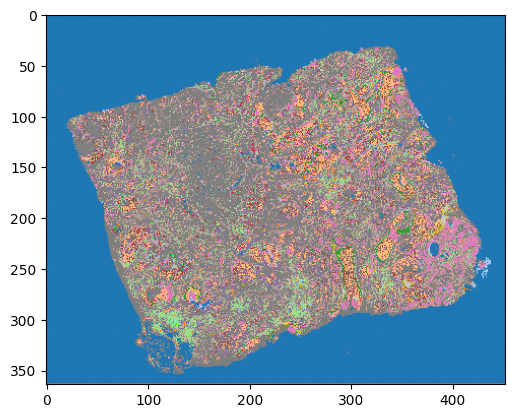

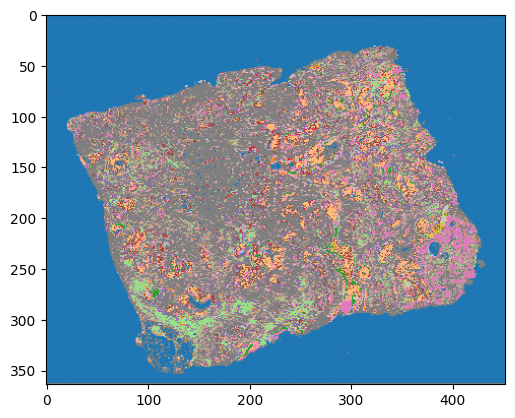

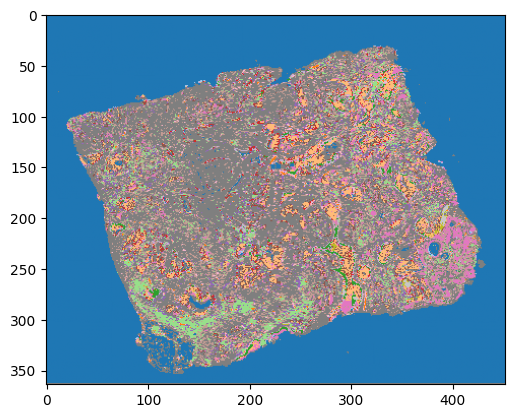

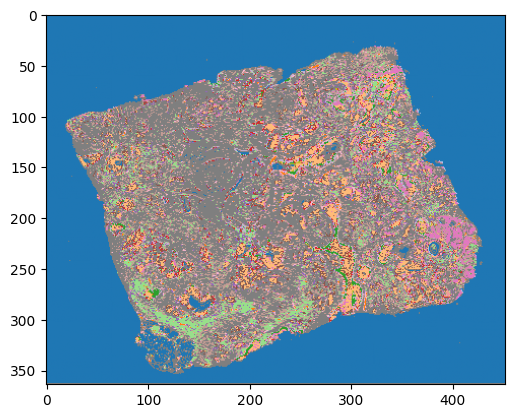

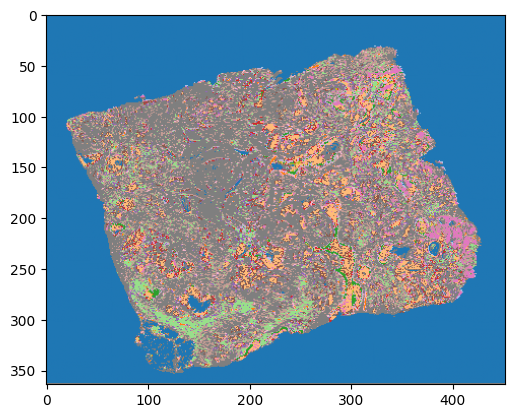

...

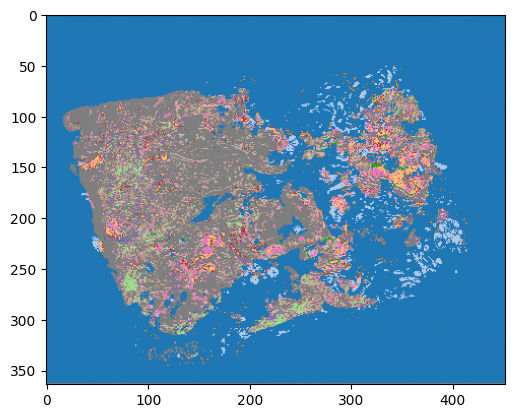

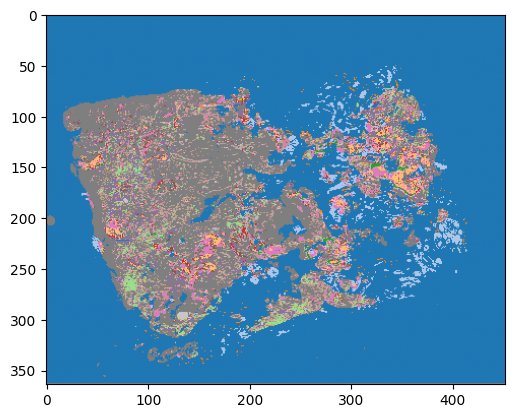

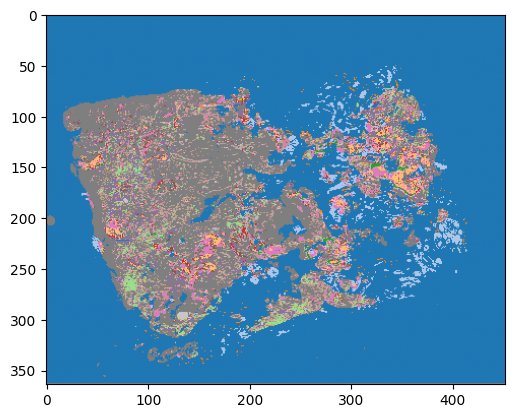

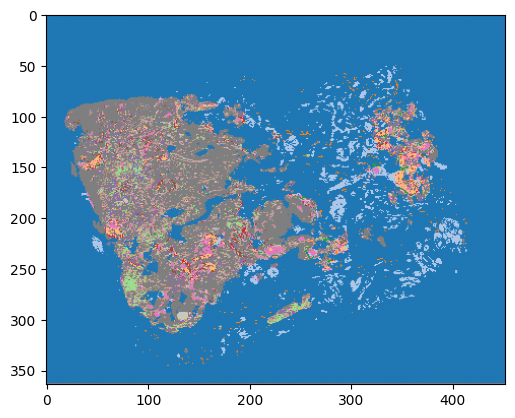

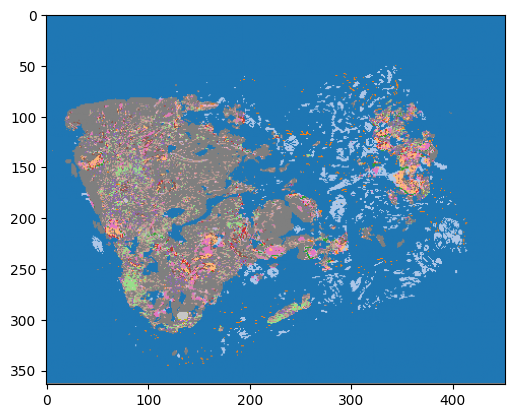

In [116]:
for x in outputs['dtype_to_clusters']['integrated'][1]:
    rgb = vis_utils.display_labeled_as_rgb(x)
    plt.imshow(rgb)
    plt.show()

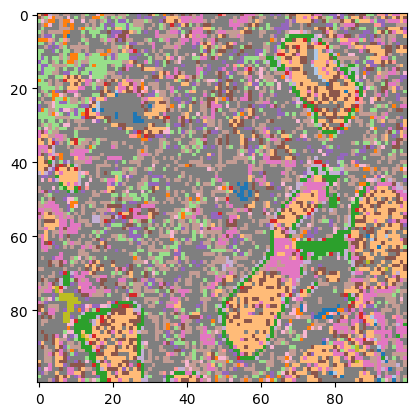

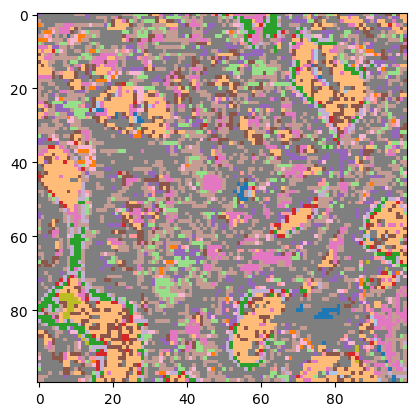

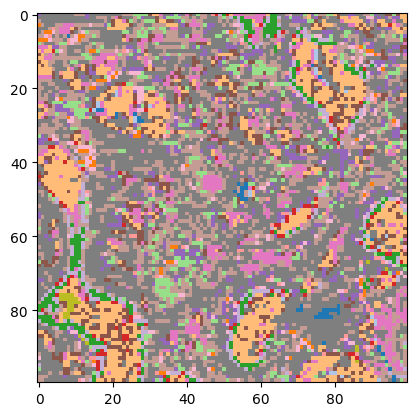

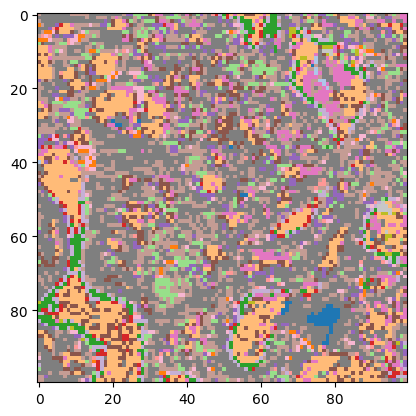

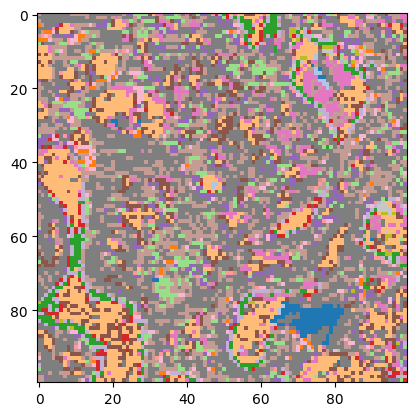

...

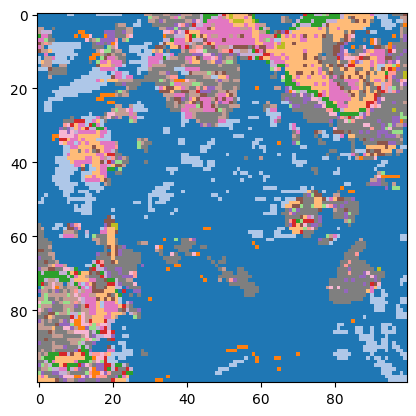

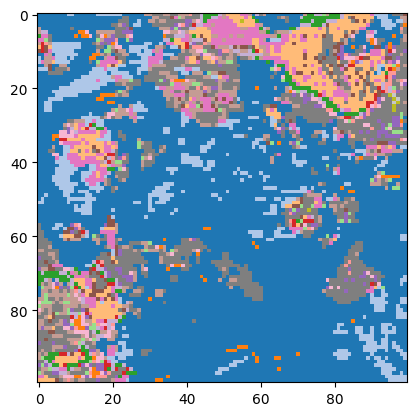

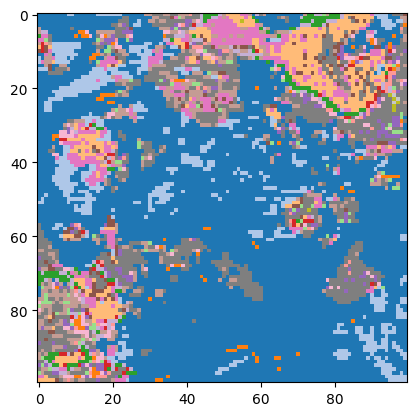

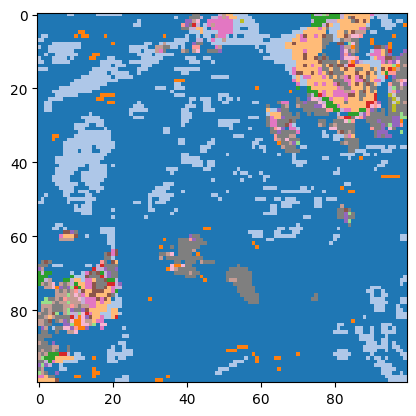

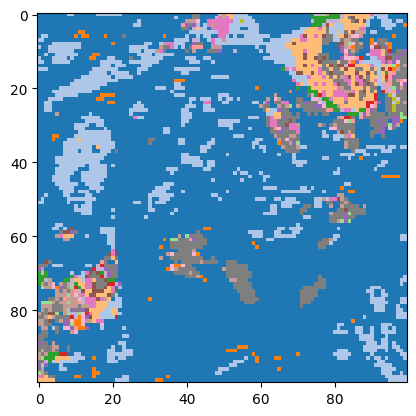

In [117]:
r1, r2, c1, c2 = 150, 250, 275, 375
for x in outputs['dtype_to_clusters']['integrated'][1]:
    rgb = vis_utils.display_labeled_as_rgb(x)
    plt.imshow(rgb[r1:r2, c1:c2])
    plt.show()

In [20]:
# be smarter about this
target_size = (363, 453)

In [21]:
from einops import rearrange
def get_tiled_sections(config, dtype='multiplex', channel_names=None, tiling_size=20, drop=None, target_size=None):
    sections = [x for x in config['sections'] if x['data'][0]['dtype']==dtype]
    
    if drop is not None:
        sections = [x for x in sections if x['sid'] not in drop]
    
    print([x['sid'] for x in sections])
    
    fps = [x['data'][0]['filepath'] for x in sections]
    
    if dtype == 'multiplex':
        channels = multiplex.get_common_channels(fps)
    elif dtype == 'xenium':
        channels = xenium.get_common_channels(fps)
    elif dtype == 'visium':
        channels = visium.get_common_channels(fps)
    elif dtype == 'cosmx':
        channels = cosmx.get_common_channels(fps)
    else:
        raise ValueError(f'{dtype} is not valid dtype')
        
    if channel_names is not None:
        present = [channel for channel in channel_names if channel in channels]
        assert len(present) == len(channel_names), f'{set(channel_names) - set(present)} not in all images'
        channels = channel_names
        print(channels)

    imgs = []
    for fp in fps:
        if dtype == 'multiplex':
            channel_to_img = multiplex.extract_ome_tiff(fp, channels=channels, as_dict=True)
            img = np.stack([channel_to_img[c] for c in channels])
        elif dtype == 'xenium':
            adata = xenium.adata_from_xenium(fp, normalize=True)
            adata = adata[:, channels]
#             img = xenium.to_multiplex(adata, tiling_size=tiling_size, method='grid')
            img = tile_xenium(adata, tile_size=tiling_size)
            img = rearrange(img, 'h w c -> c h w')
        elif dtype == 'visium':
            adata = visium.adata_from_visium(fp, normalize=True)
            adata = adata[:, channels]
            img = visium.to_multiplex(adata, tiling_size=tiling_size, method='radius')
            img = rearrange(img, 'h w c -> c h w')
        elif dtype == 'cosmx':
            adata = cosmx.adata_from_cosmx(fp, normalize=True)
            adata = adata[:, channels]
#             img = xenium.to_multiplex(adata, tiling_size=tiling_size, method='grid')
            img = tile_xenium(adata, tile_size=tiling_size)
            img = rearrange(img, 'h w c -> c h w')

        if target_size is not None and img.shape[-2:] != target_size:
            img = utils.rescale(img, size=target_size, target_dtype=img.dtype, dim_order='c h w')

        print(img.shape)
        imgs.append(img)
    x = np.stack(imgs)
    print(x.shape, x.dtype)
    
    if x.dtype != np.uint8:
        x = x - x.min((0, 2, 3), keepdims=True)
        x = x / x.max((0, 2, 3), keepdims=True)
        x = x * 255
        x = x.astype(np.uint8)
    
    return x

In [22]:
xenium_tiled = get_tiled_sections(config, dtype='xenium', tiling_size=20, target_size=target_size)
xenium_tiled.shape

['HT704B1-U1', 'HT704B1-U17', 'HT704B1-U26', 'HT704B1-U33', 'HT704B1-U41', 'HT704B1-U50']


/tmp/ipykernel_895921/982597298.py:43: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


(476, 363, 453)


/tmp/ipykernel_895921/982597298.py:43: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


(476, 363, 453)


/tmp/ipykernel_895921/982597298.py:43: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


(476, 363, 453)


/tmp/ipykernel_895921/982597298.py:43: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


(476, 363, 453)


/tmp/ipykernel_895921/982597298.py:43: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


(476, 363, 453)


/tmp/ipykernel_895921/982597298.py:43: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


(476, 363, 453)
(6, 476, 363, 453) float64


(6, 476, 363, 453)

In [23]:
drop = ['HT704B1-U14', 'HT704B1-U47', 'HT704B1-U43', 'HT704B1-U53', 'HT704B1-U91']
cosmx_tiled = get_tiled_sections(config, dtype='cosmx', tiling_size=20, drop=drop, target_size=target_size)
cosmx_tiled.shape

['HT704B1-U22', 'HT704B1-U56']


/tmp/ipykernel_895921/982597298.py:43: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


(1000, 363, 453)


/tmp/ipykernel_895921/982597298.py:43: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['grid_name'] = [f'{x // tile_size}_{y // tile_size}' for x, y in adata.obsm['spatial']]


(1000, 363, 453)
(2, 1000, 363, 453) float64


(2, 1000, 363, 453)

In [24]:
drop = ['HT704B1-U14', 'HT704B1-U47', 'HT704B1-U43', 'HT704B1-U53', 'HT704B1-U91']
multiplex_tiled = get_tiled_sections(config, dtype='multiplex', target_size=target_size, drop=drop)
multiplex_tiled.shape

['HT704B1-U11', 'HT704B1-U19', 'HT704B1-U27', 'HT704B1-U35', 'HT704B1-U60', 'HT704B1-U68', 'HT704B1-U76', 'HT704B1-U82', 'HT704B1-U85']
(38, 363, 453)
(38, 363, 453)
(38, 363, 453)
(38, 363, 453)
(38, 363, 453)
(38, 363, 453)
(38, 363, 453)
(38, 363, 453)
(38, 363, 453)
(9, 38, 363, 453) uint8


(9, 38, 363, 453)

In [25]:
# # add one hot encoding for neighborhoods
# labels = np.unique(outputs['dtype_to_clusters']['integrated'][1])
# hots = [outputs['dtype_to_clusters']['integrated'][1] == label for label in labels]
# hots = np.stack(hots)
# hots = rearrange(hots, 'c n h w -> n h w c')

# hots.shape

In [26]:
# add one hot encoding for neighborhoods
labels = np.unique(data['labeled']['integrated'])
hots = [data['labeled']['integrated'] == label for label in labels]
hots = np.stack(hots)
c, n = hots.shape[:2]
hots = rearrange(hots, 'c n h w -> (c n) h w')
hots = utils.rescale(hots, size=target_size, target_dtype=hots.dtype, dim_order='c h w')
hots = rearrange(hots, '(c n) h w -> n c h w', c=c, n=n)

hots.shape

(93, 17, 363, 453)

In [79]:
outputs['dtype_to_cluster_probs']['multiplex'][1].shape

(9, 364, 452, 21)

In [80]:
nbhd_probs = outputs['dtype_to_cluster_probs']['multiplex'][1]
c, n = nbhd_probs.shape[3], nbhd_probs.shape[0]
nbhd_probs = rearrange(nbhd_probs, 'n h w c -> (c n) h w')
nbhd_probs = utils.rescale(nbhd_probs, size=target_size, target_dtype=nbhd_probs.dtype, dim_order='c h w')
nbhd_probs = rearrange(nbhd_probs, '(c n) h w -> n c h w', c=c, n=n)
nbhd_probs.shape

(9, 21, 363, 453)

In [86]:
np.vectorize(lambda l: positions[l])([1,2,3])

array([18, 26, 34])

In [115]:
def get_positions(drop, dtype):
    idxs = [i
           for i, (sid, dt) in zip(outputs['section_positions'], outputs['section_ids'])
           if sid not in drop and dtype == dt]
    return idxs

def to_position(z):
    return positions[z]

def interpolate_stack(
        volume, # (z, h, w)
        positions,
        method='linear',
    ):
    
    grid = np.stack(np.meshgrid(
        np.arange(volume.shape[0]),
        np.arange(volume.shape[1]),
        np.arange(volume.shape[2]),
        indexing='ij'
    ))
    
    positions = np.asarray(positions)
    grid[0] = np.vectorize(lambda l: positions[l])(grid[0])

    pts = rearrange(grid, 'n z h w -> (z h w) n')
    x, y, z = positions, np.arange(volume.shape[-2]), np.arange(volume.shape[-1])
    interp = RegularGridInterpolator((x, y, z), volume, method='linear')
    
    target_pts = np.stack(np.meshgrid(
        np.arange(np.min(positions), np.max(positions)),
        np.arange(volume.shape[-2]),
        np.arange(volume.shape[-1]),
        indexing='ij'
    ))
    target_pts = rearrange(target_pts, 'n z h w -> (z h w) n')
    
#     batch_size = 100000
#     results = []
#     for i in range(0, len(target_pts), batch_size):
#         print(i)
#         results.append(interp(target_pts[i:i+batch_size]))
#     results = np.concat(results)
    
    result = interp(target_pts)
    
    result = rearrange(result, '(z h w) -> z h w',
                       z=np.max(positions) - np.min(positions),
                       h=volume.shape[-2],
                       w=volume.shape[-1])
    return result


In [113]:
output_dir = Path('/data/estorrs/sandbox/mushroom/imaris/combined')
output_dir.mkdir(parents=True, exist_ok=True)

In [ ]:
i = 0
recipes = [
    {
        'identifier': 'multiplextiles',
        'dtype': 'multiplex',
        'method': 'linear',
    },
    {
        'identifier': 'xeniumtiles',
        'dtype': 'xenium',
        'method': 'linear',
    },
    {
        'identifier': 'cosmxtiles',
        'dtype': 'multiplex',
        'method': 'linear',
    },
    {
        'identifier': 'multiplexprobs',
        'dtype': 'multiplex',
        'method': 'linear',
    }
]

volume, dtype in zip([multiplex_tiled, xenium_tiled, cosmx_tiled, ]):
    

In [114]:
positions = np.asarray(get_positions(drop=drop, dtype='multiplex'))
volume = multiplex_tiled[:, 24]
result = interpolate_stack(volume, positions)
result.dtype, result.shape

(dtype('float64'), (74, 363, 453))

In [ ]:
for x in result:
    plt.imshow(x)
    plt.show()

In [28]:

def to_position(z):
    return positions[z]

In [29]:
multiplex_tiled.shape

(9, 38, 363, 453)

In [30]:

grid = np.stack(np.meshgrid(
    np.arange(multiplex_tiled.shape[0]),
    np.arange(multiplex_tiled.shape[2]),
    np.arange(multiplex_tiled.shape[3]),
    indexing='ij'
))
grid.shape

(3, 9, 363, 453)

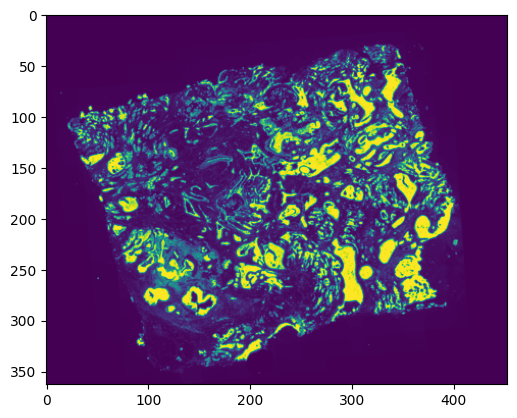

In [31]:
test_idx = 24
plt.imshow(multiplex_tiled[0, test_idx, ...])

In [32]:
positions = np.asarray(get_positions(drop=drop, dtype='multiplex'))
grid[0] = np.vectorize(to_position)(grid[0])

pts = rearrange(grid, 'n z h w -> (z h w) n')
values = rearrange(multiplex_tiled[:, test_idx], 'z h w -> (z h w)')
pts.shape, values.shape

((1479951, 3), (1479951,))

In [46]:
from scipy.interpolate import RegularGridInterpolator
x, y, z = positions, np.arange(multiplex_tiled.shape[-2]), np.arange(multiplex_tiled.shape[-1])
data = multiplex_tiled[:, test_idx]
interp = RegularGridInterpolator((x, y, z), data, method=)

In [57]:
target_pts = np.stack(np.meshgrid(
    np.arange(10, max(positions)),
    np.arange(multiplex_tiled.shape[2]),
    np.arange(multiplex_tiled.shape[3]),
    indexing='ij'
))
target_pts = rearrange(target_pts, 'n z h w -> (z h w) n')
target_pts.shape

(12168486, 3)

In [58]:
result = interp(target_pts)

In [63]:
result = rearrange(result, '(z h w) -> z h w',
                   z=max(positions) - 10,
                   h=multiplex_tiled.shape[2],
                   w=multiplex_tiled.shape[3])
result.shape

(74, 363, 453)

In [ ]:
for x in result:
    plt.imshow(x)
    plt.show()

In [106]:
positions = np.asarray(get_positions(drop=drop, dtype='multiplex'))
grid[0] = np.vectorize(to_position)(grid[0])

In [108]:
grid[..., 0, 4, 2]

array([10,  4,  2])

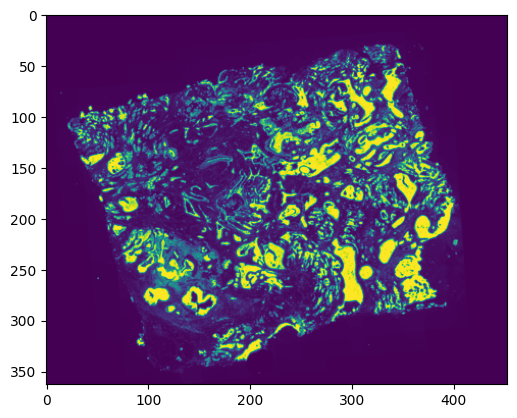

In [114]:
test_idx = 24
plt.imshow(multiplex_tiled[0, test_idx, ...])

In [137]:
pts = rearrange(grid, 'n z h w -> (z h w) n')
values = rearrange(multiplex_tiled[:, test_idx], 'z h w -> (z h w)')
pts.shape, values.shape

((1479951, 3), (1479951,))

In [141]:
target_pts = np.stack(np.meshgrid(
    np.arange(max(positions)),
    np.arange(multiplex_tiled.shape[2]),
    np.arange(multiplex_tiled.shape[3]),
    indexing='ij'
))
target_pts = target_pts[:, 15:16]
target_pts = rearrange(target_pts, 'n z h w -> (z h w) n')
target_pts.shape

(164439, 3)

In [ ]:
from scipy.interpolate import griddata
result = griddata(pts, values, target_pts, method='linear')

In [33]:
import scipy
scipy.__version__

'1.12.0'

In [34]:
def f(x, y, z):
    return 2 * x**3 + 3 * y**2 - z
x = np.linspace(1, 4, 11)
y = np.linspace(4, 7, 22)
z = np.linspace(7, 9, 33)
xg, yg ,zg = np.meshgrid(x, y, z, indexing='ij', sparse=True)
data = f(xg, yg, zg)

In [35]:
data.shape

(11, 22, 33)

In [36]:
x.shape, y.shape, x.shape

((11,), (22,), (11,))

In [37]:
xg.shape, yg.shape, zg.shape

((11, 1, 1), (1, 22, 1), (1, 1, 33))

In [126]:
interp = RegularGridInterpolator((x, y, z), data)

In [118]:
z

array([10, 10, 10, ..., 84, 84, 84])

In [119]:
x

array([  0,   1,   2, ..., 450, 451, 452])

In [120]:
y

array([  0,   0,   0, ..., 362, 362, 362])

In [80]:
from scipy.interpolate import RegularGridInterpolator

In [117]:
interp = RegularGridInterpolator((z, y, x), values)

ValueError: The points in dimension 0 must be strictly ascending or descending

In [ ]:
from numpy import array
from scipy.interpolate import RegularGridInterpolator as rgi
my_interpolating_function = rgi((x,y,z), V)
Vi = my_interpolating_function(array([xi,yi,zi]).T)

In [14]:
mushroom_dir = os.path.join(project_dir, 'mushroom_20res')
mushroom_dir

'/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/mushroom_20res'

In [15]:
mushroom = Mushroom.from_config(mushroom_dir, accelerator='gpu')

INFO:root:loading spore for cosmx
INFO:root:data mask detected
INFO:root:starting cosmx processing
INFO:root:using 1000 channels
INFO:root:2 sections detected: ['HT704B1-U22', 'HT704B1-U56']
INFO:root:processing sections
INFO:root:generating image data for section HT704B1-U22
INFO:root:generating image data for section HT704B1-U56


cosmx torch.Size([1000, 363, 454])


INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 2 sections detected: [('HT704B1-U22', 'cosmx'), ('HT704B1-U56', 'cosmx')]
INFO:root:creating data loaders
INFO:torch.distributed.nn.jit.instantiator:Created a temporary directory at /tmp/tmpvqsyjg0k
INFO:torch.distributed.nn.jit.instantiator:Writing /tmp/tmpvqsyjg0k/_remote_module_non_scriptable.py
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT704B1/mushroom_20res/cosmx_chkpts/last.ckpt
INFO:root:loading spore for he
INFO:root:data mask detected
INFO:root:starting he processing
INFO:root:20 sections detected: ['HT704B1-U12', 'HT704B1-U15', 'HT704B1-U20', 'HT704B1-U23', 'HT704B1-U28', 'HT704B1-U31', 'HT704B1-U36', 'HT704B1-U39', 'HT704B1-U44', 'HT704B1-U48'

0.05


INFO:root:generating image data for section HT704B1-U15
INFO:root:generating image data for section HT704B1-U20
INFO:root:generating image data for section HT704B1-U23
INFO:root:generating image data for section HT704B1-U28
INFO:root:generating image data for section HT704B1-U31
INFO:root:generating image data for section HT704B1-U36
INFO:root:generating image data for section HT704B1-U39
INFO:root:generating image data for section HT704B1-U44
INFO:root:generating image data for section HT704B1-U48
INFO:root:generating image data for section HT704B1-U54
INFO:root:generating image data for section HT704B1-U57
INFO:root:generating image data for section HT704B1-U61
INFO:root:generating image data for section HT704B1-U65
INFO:root:generating image data for section HT704B1-U69
INFO:root:generating image data for section HT704B1-U73
INFO:root:generating image data for section HT704B1-U81
INFO:root:generating image data for section HT704B1-U84
INFO:root:generating image data for section HT70

he torch.Size([3, 362, 453])


INFO:root:loading spore for multiplex
INFO:root:data mask detected
INFO:root:starting multiplex processing
INFO:root:using 38 channels
INFO:root:9 sections detected: ['HT704B1-U11', 'HT704B1-U19', 'HT704B1-U27', 'HT704B1-U35', 'HT704B1-U60', 'HT704B1-U68', 'HT704B1-U76', 'HT704B1-U82', 'HT704B1-U85']
INFO:root:processing sections
INFO:root:generating image data for section HT704B1-U11


0.05


INFO:root:generating image data for section HT704B1-U19
INFO:root:generating image data for section HT704B1-U27
INFO:root:generating image data for section HT704B1-U35
INFO:root:generating image data for section HT704B1-U60
INFO:root:generating image data for section HT704B1-U68
INFO:root:generating image data for section HT704B1-U76
INFO:root:generating image data for section HT704B1-U82
INFO:root:generating image data for section HT704B1-U85
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 9 sections detected: [('HT704B1-U11', 'multiplex'), ('HT704B1-U19', 'multiplex'), ('HT704B1-U27', 'multiplex'), ('HT704B1-U35', 'multiplex'), ('HT704B1-U60', 'multiplex'), ('HT704B1-U68', 'multiplex'), ('HT704B1-U76', 'multiplex'), ('HT704B1-U82', 'multiplex'), ('HT704B1-U85', 'multiplex')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
I

multiplex torch.Size([38, 362, 453])


INFO:root:loading spore for xenium
INFO:root:data mask detected
INFO:root:starting xenium processing
INFO:root:using 476 channels
INFO:root:6 sections detected: ['HT704B1-U1', 'HT704B1-U17', 'HT704B1-U26', 'HT704B1-U33', 'HT704B1-U41', 'HT704B1-U50']
INFO:root:processing sections
INFO:root:generating image data for section HT704B1-U1
INFO:root:generating image data for section HT704B1-U17
INFO:root:generating image data for section HT704B1-U33
INFO:root:generating image data for section HT704B1-U41
INFO:root:generating image data for section HT704B1-U50
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 6 sections detected: [('HT704B1-U1', 'xenium'), ('HT704B1-U17', 'xenium'), ('HT704B1-U26', 'xenium'), ('HT704B1-U33', 'xenium'), ('HT704B1-U41', 'xenium'), ('HT704B1-U50', 'xenium')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU core

Predicting: |                                                                                                 …

INFO:root:embedding he spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Predicting: |                                                                                                 …

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [16]:
from torch.nn import Identity
for dtype, spore in mushroom.dtype_to_spore.items():
    spore.inference_dl.dataset.transform.dtype_to_norm = {dtype: Identity()}

In [17]:
mushroom.embed_sections()

INFO:root:embedding cosmx spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Predicting: |                                                                                                 …

INFO:root:embedding he spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Predicting: |                                                                                                 …

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [18]:
from einops import rearrange

# dtype_to_channels = {}
dtype_to_channels = {
    'visium': [
        'EPCAM',
        'PTPRC',
        'CD3E',
        'CD4',
        'IL7R',
        'PECAM1',
        'MS4A1',
        'ITGAM',
        'HLA-DRA',
        'CD68',
        'CD163',
        'ACTA2',
        'MGP',
        'PDPN',
    ]
}

In [ ]:
z_scaler = .2
keep_dtypes = ['multiplex', 'xenium', 'visium']

dtypes, spores = zip(*mushroom.dtype_to_spore.items())

section_positions = []
sids = []
for spore in spores:
    section_positions += [entry['position'] for entry in spore.sections]
    sids += spore.section_ids
section_positions, sids = zip(*sorted([(p, tup) for p, tup in zip(section_positions, sids)], key=lambda x: x[0]))

section_positions = (np.asarray(section_positions) * z_scaler).astype(int)
for i, (val, (ident, dtype)) in enumerate(zip(section_positions, sids)):
    if i > 0:
        old = section_positions[i-1]
        old_ident = sids[i-1][0]
        if old == val and old_ident != ident:
            section_positions[i:] = section_positions[i:] + 1

start, stop = section_positions[0], section_positions[-1]
print(start, stop)
dtype_to_volume = {}
for dtype, spore in zip(dtypes, spores):
    if dtype in keep_dtypes:
        print(dtype)
        positions = [p for p, (_, dt) in zip(section_positions, sids) if dt==dtype]
        
        keep_channels = dtype_to_channels.get(dtype)
        if keep_channels is None:
            data = np.stack(spore.true_pixels)
        else:
            missing = set(keep_channels) - set(spore.dtype_to_channels[dtype]) 
            assert len(missing) == 0, f'channels {missing} are missing for {dtype}'
            idxs = [i for i, x in enumerate(spore.dtype_to_channels[dtype]) if x in keep_channels]
            data = np.stack(spore.true_pixels)[..., idxs]

        if positions[0] != start:
            positions.insert(0, start)
            data = np.concatenate((data[:1], data))
        if positions[-1] != stop:
            positions.append(stop)
            data = np.concatenate((data, data[-1:]))

        data = rearrange(data, 'n h w c -> c n h w')
        volume = utils.get_interpolated_volume(data, positions, method='linear')
        volume = rearrange(volume, 'c n h w -> n h w c')
        dtype_to_volume[dtype] = volume

0 92
multiplex
xenium


In [1]:
dtype_to_volume['multiplex'].shape

NameError: name 'dtype_to_volume' is not defined

In [24]:
mushroom.integrated_clusters[-1].shape

(37, 148, 180)

In [25]:
mushroom.section_positions

array([ 0, 10, 11, 14, 16, 18, 19, 21, 22, 25, 26, 27, 30, 32, 34, 35, 38,
       40, 43, 47, 49, 53, 55, 56, 59, 60, 64, 67, 68, 72, 75, 80, 81, 83,
       84, 91, 92])

In [26]:
mushroom.dtype_to_volume['integrated'].shape

(93, 148, 180)

In [29]:
# add one hot encoding for neighborhoods
labels = np.unique(mushroom.dtype_to_volume['integrated'])
hots = [mushroom.dtype_to_volume['integrated'] == label for label in labels]
hots = np.stack(hots)
hots = rearrange(hots, 'c n h w -> n h w c')
dtype_to_volume['integratedneighborhoods'] = hots

hots.shape

(93, 148, 180, 20)

In [ ]:
# add one hot encoding for dtype specific neighborhoods
for k in []:
    for l in range(mushroom.num_levels):
        v = mushroom.dtype_to_volume[k][l]
        labels = np.unique(v)
        hots = [v == label for label in labels]
        hots = np.stack(hots)
        hots = rearrange(hots, 'c n h w -> n h w c')
        dtype_to_volume[f'{k}{l}neighborhoods'] = hots

dtype_to_volume.keys()

In [ ]:
# manual annotations
df = mushroom.calc
sns.clus
## annotate

In [32]:
combined = []
channels = []
for dtype, volume in dtype_to_volume.items():
    print(dtype, volume.shape)
    combined.append(volume)
    
    keep_channels = dtype_to_channels.get(dtype)
    if keep_channels is None:
        if dtype in mushroom.dtype_to_spore:
            cs = mushroom.dtype_to_spore[dtype].dtype_to_channels[dtype]
        else:
            cs = np.arange(volume.shape[-1])
        channels += [f'{dtype}_{c}' for c in cs]
    else:
        channels += keep_channels
    
combined = np.concatenate(combined, axis=-1)
channels = [f'{i+1}_{x}' for i, x in enumerate(channels)]
combined.shape, len(channels), channels[:5], channels[-5:]

multiplex (93, 148, 180, 38)
xenium (93, 148, 180, 476)
neighborhoods (93, 148, 180, 20)


((93, 148, 180, 534),
 534,
 ['1_multiplex_BCA1',
  '2_multiplex_CD11b',
  '3_multiplex_CD163',
  '4_multiplex_CD20',
  '5_multiplex_CD31'],
 ['530_neighborhoods_15',
  '531_neighborhoods_16',
  '532_neighborhoods_17',
  '533_neighborhoods_18',
  '534_neighborhoods_19'])

In [33]:
len(channels)

534

In [34]:
[x for x in channels if 'EPCAM' in x]

['206_xenium_EPCAM']

In [35]:
[x for x in channels if 'PanC' in x]

[]

In [36]:
if combined.dtype != np.uint8:
    combined = combined - combined.min((0,1,2), keepdims=True)
    combined = combined / combined.max((0,1,2), keepdims=True)
#     combined = combined - combined.min()
#     combined = combined / combined.max()
    
    combined = combined * 255
    combined = combined.astype(np.uint8)

In [37]:
combined.shape

(93, 148, 180, 534)

In [38]:
combined.max((0,1,2))

array([255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255,
       255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 255, 25

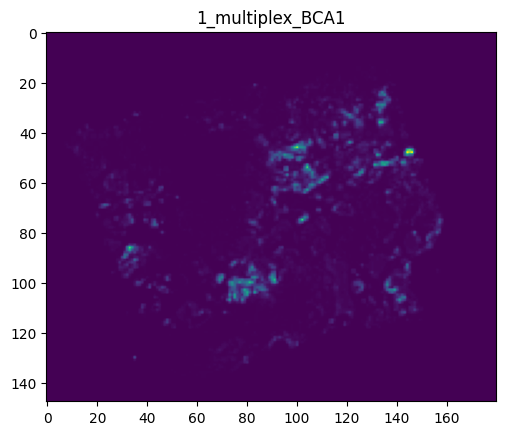

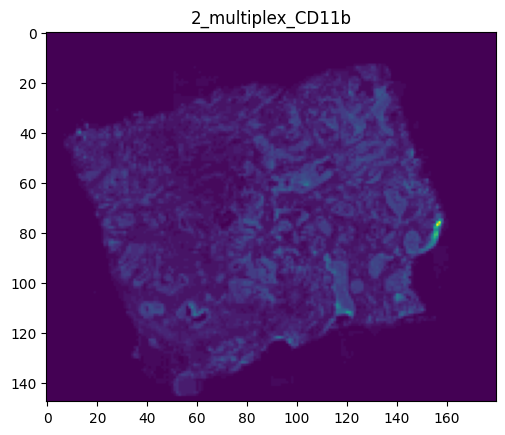

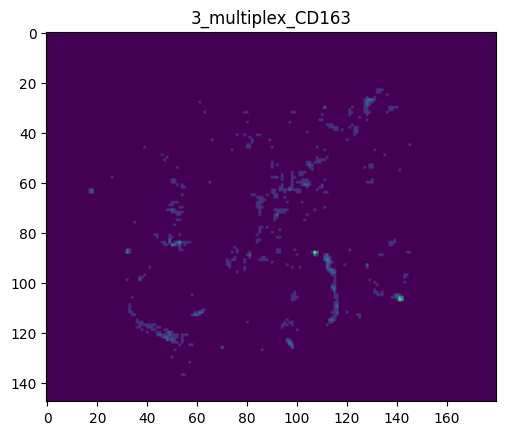

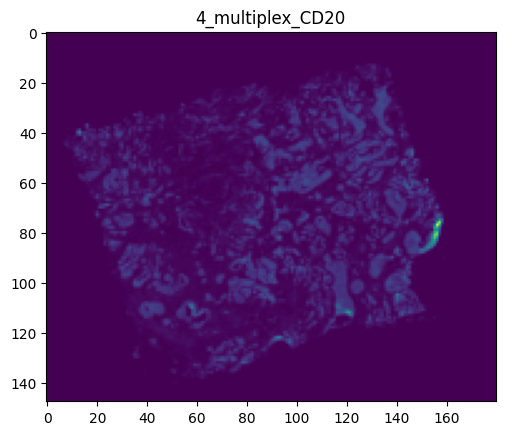

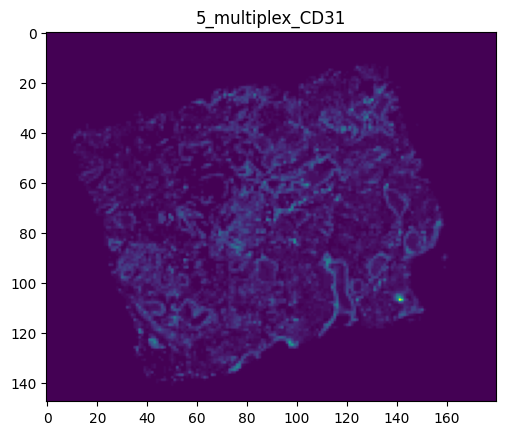

...

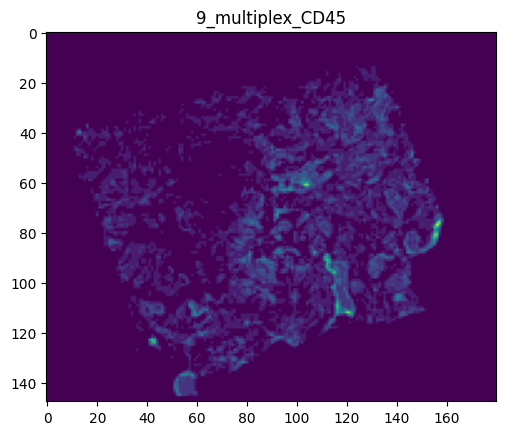

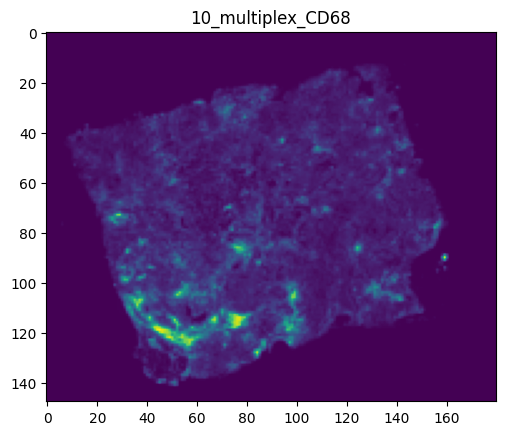

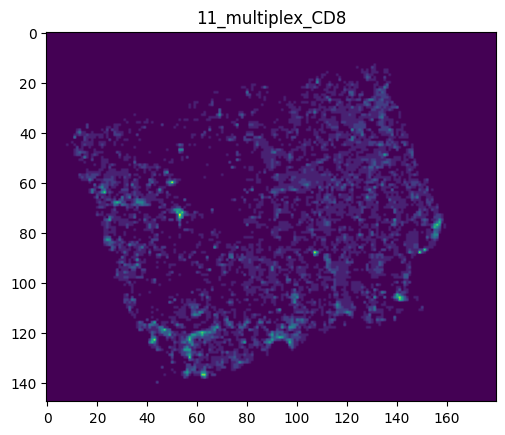

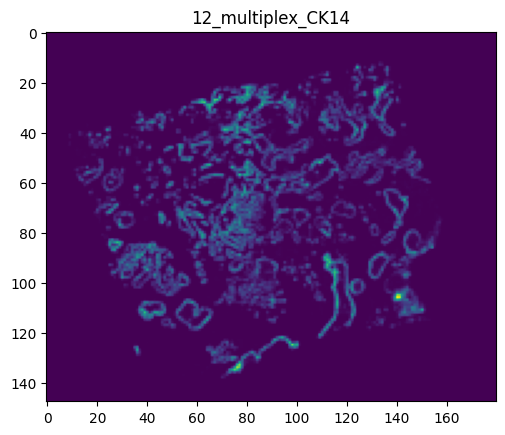

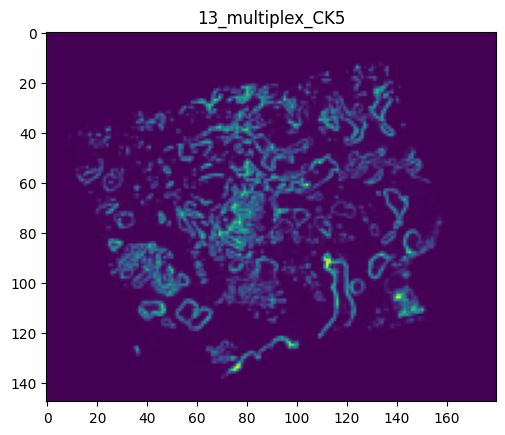


KeyboardInterrupt



<Figure size 640x480 with 0 Axes>

In [40]:
for i, x in enumerate(rearrange(combined[0, ...], 'h w c -> c h w')):
    plt.imshow(x)
    plt.title(channels[i])
    plt.show()

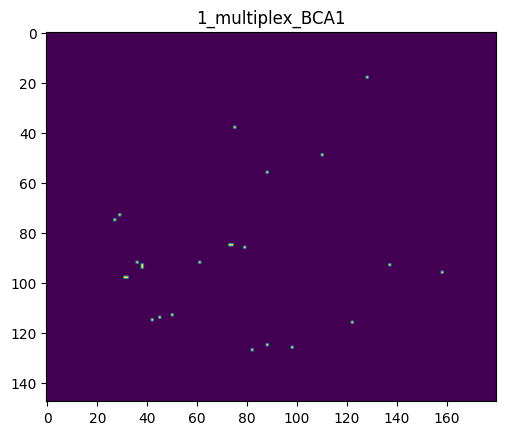

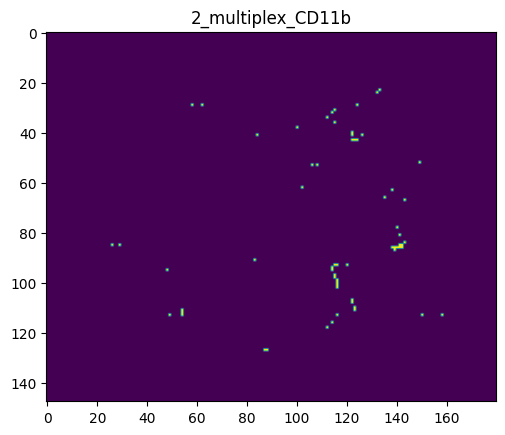

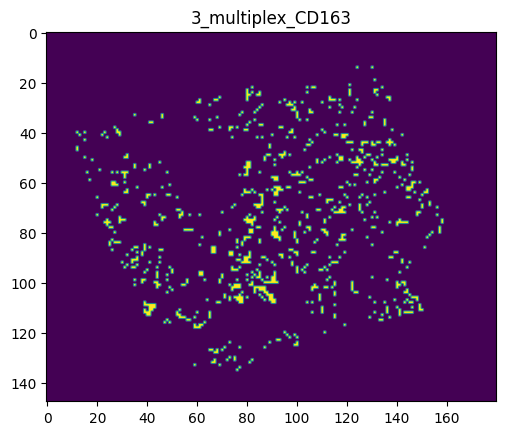

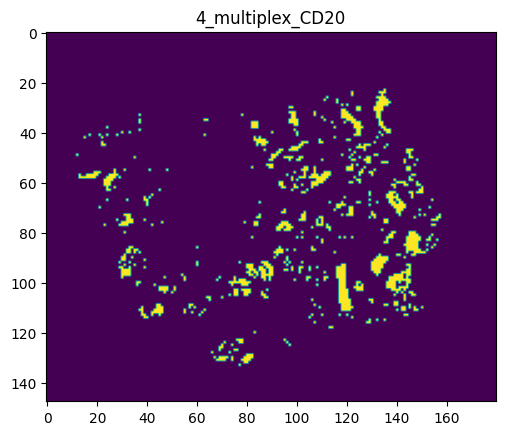

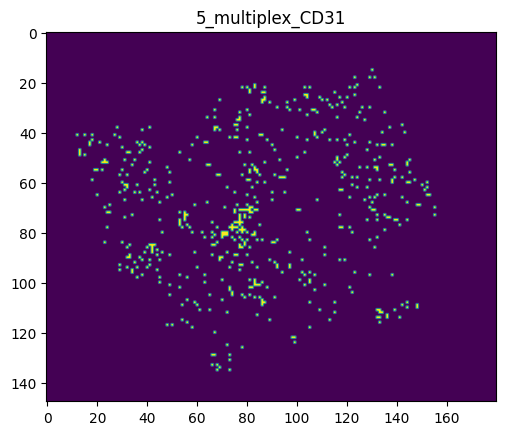

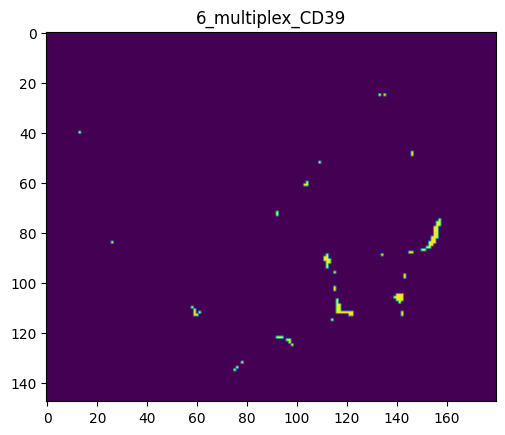

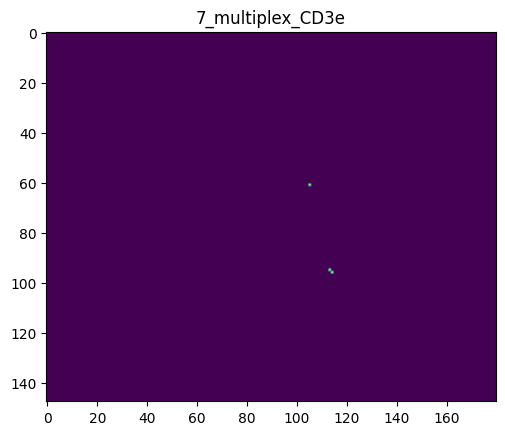

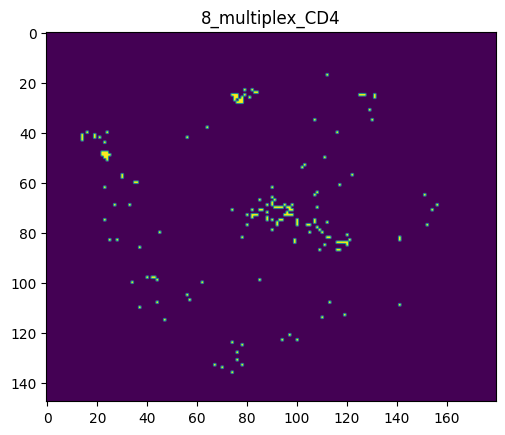

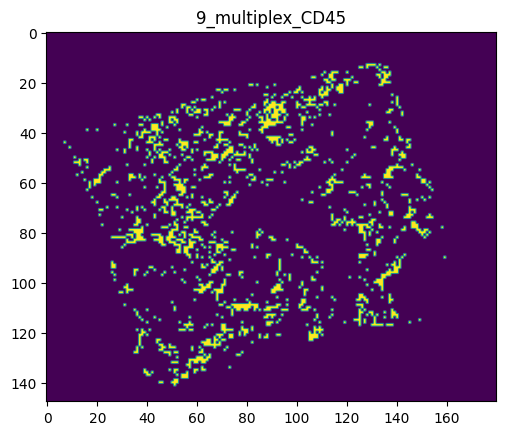

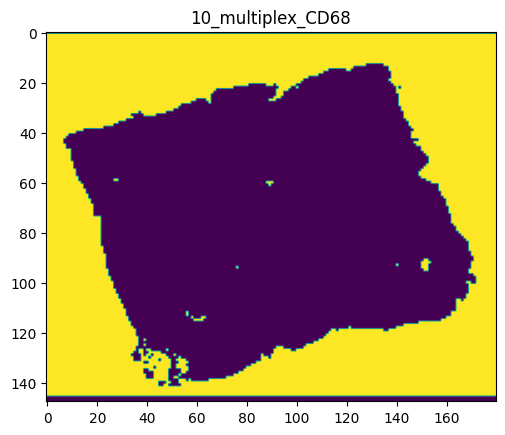

In [43]:
for i, x in enumerate(rearrange(combined[0], 'h w c -> c h w')[-10:]):
    plt.imshow(x)
    plt.title(channels[i])
    plt.show()

In [44]:
combined.shape

(93, 148, 180, 534)

In [45]:

directory = Path(os.path.join(project_dir, 'imaris', 'combined'))
directory.mkdir(parents=True, exist_ok=True)
for c in range(combined.shape[-1]):
    if c % 100 == 0:
        print(c, channels[c])
    filepath = directory / f'{case}_C{c}.tif'
    with tifffile.TiffWriter(filepath, bigtiff=True) as tif:
        metadata={
            'axes': 'XYZCT',
            'PhysicalSizeX': config['resolution'],
            'PhysicalSizeXUnit': 'µm',
            'PhysicalSizeY': config['resolution'],
            'PhysicalSizeYUnit': 'µm',
        }
        tif.write(
            rearrange(combined[..., c], 'z h w -> 1 1 z h w'),
            metadata=metadata,
            compression='LZW',
        )
meta = {
    'channels': channels,
    'sections': [x for x, _ in mushroom.section_ids]
}
yaml.safe_dump(meta, open(directory / 'metadata.yaml', 'w'))

0 1_multiplex_BCA1
100 101_xenium_CCDC39
200 201_xenium_EHF
300 301_xenium_KRT17
400 401_xenium_PTGDS
500 501_xenium_TOX


In [42]:
directory

PosixPath('/data/estorrs/mushroom/data/projects/submission_v1/HT704B1/imaris/combined')

In [43]:
channels

['0_multiplex_BCA1',
 '1_multiplex_CD11b',
 '2_multiplex_CD163',
 '3_multiplex_CD20',
 '4_multiplex_CD31',
 '5_multiplex_CD39',
 '6_multiplex_CD3e',
 '7_multiplex_CD4',
 '8_multiplex_CD45',
 '9_multiplex_CD68',
 '10_multiplex_CD8',
 '11_multiplex_CK14',
 '12_multiplex_CK5',
 '13_multiplex_COX6c',
 '14_multiplex_CTLA4',
 '15_multiplex_DAPI',
 '16_multiplex_E-cadherin',
 '17_multiplex_FOXP3',
 '18_multiplex_GATA3',
 '19_multiplex_GLUT1',
 '20_multiplex_Granzyme-B',
 '21_multiplex_HIF1A',
 '22_multiplex_HLA-DR',
 '23_multiplex_Her2',
 '24_multiplex_Ki67',
 '25_multiplex_MGP',
 '26_multiplex_MLPH',
 '27_multiplex_PD1',
 '28_multiplex_PLAT/tPA',
 '29_multiplex_PR',
 '30_multiplex_Pan-Cytokeratin',
 '31_multiplex_Podoplanin',
 '32_multiplex_SLC39A6',
 '33_multiplex_SMA',
 '34_multiplex_TCF-1',
 '35_multiplex_TFF1',
 '36_multiplex_Vimentin',
 '37_multiplex_cKit',
 '38_xenium_ABCC11',
 '39_xenium_ACE2',
 '40_xenium_ACKR1',
 '41_xenium_ACTA2',
 '42_xenium_ACTG2',
 '43_xenium_ADAM28',
 '44_xeniu

In [49]:
50 * 148

7400

In [ ]:
50 ppm

In [47]:
450 / 50 * .2

1.8

In [48]:
93 / 1.8

51.666666666666664

In [117]:
sections = [x for x in config['sections'] if x['data'][0]['dtype']=='multiplex']
sections

[{'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s1_HT206B1-U2_multiplex.ome.tiff'}],
  'position': 5,
  'sid': 'HT206B1-U2'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s3_HT206B1-U5_multiplex.ome.tiff'}],
  'position': 20,
  'sid': 'HT206B1-U5'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s6_HT206B1-U10_multiplex.ome.tiff'}],
  'position': 50,
  'sid': 'HT206B1-U10'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s8_HT206B1-U13_multiplex.ome.tiff'}],
  'position': 65,
  'sid': 'HT206B1-U13'},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s11_HT206B1-U18_multiplex.ome.tiff'}],
  'position': 90,
  'sid': 'HT206B1-U

In [118]:
fps = [x['data'][0]['filepath'] for x in sections]
fps

['/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s1_HT206B1-U2_multiplex.ome.tiff',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s3_HT206B1-U5_multiplex.ome.tiff',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s6_HT206B1-U10_multiplex.ome.tiff',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s8_HT206B1-U13_multiplex.ome.tiff',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s11_HT206B1-U18_multiplex.ome.tiff',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/registered/s13_HT206B1-U21_multiplex.ome.tiff']

In [119]:
mpp = 1.
from einops import rearrange

In [120]:
channels = multiplex.get_common_channels(fps)
imgs = []
for fp in fps:
    channel_to_img = multiplex.extract_ome_tiff(fp, channels=channels, as_dict=True)
    img = np.stack([channel_to_img[c] for c in channels])
    img = img[:, 2000:3000, 2000:3000]
    imgs.append(img)
x = np.stack(imgs)
x.shape

(6, 33, 1000, 1000)

In [128]:
from ome_types import OME, model, to_xml

In [141]:


o = model.OME()
o.images.append(
    model.Image(
        id='Image:0',
        pixels=model.Pixels(
            dimension_order='XYCZT',
            size_c=len(channels),
            size_t=1,
            size_x=x.shape[-2],
            size_y=x.shape[-1],
            size_z=x.shape[0],
            type='uint8',
            big_endian=False,
            channels=[model.Channel(id=f'Channel:{i}', name=c) for i, c in enumerate(channels)],
            physical_size_x=config['resolution'],
            physical_size_y=config['resolution'],
            physical_size_x_unit='µm',
            physical_size_y_unit='µm'
        )
    )
)

im = o.images[0]
for i in range(len(im.pixels.channels)):
    for j in range(x.shape[0]):
        im.pixels.planes.append(model.Plane(the_c=i, the_t=0, the_z=j))
im.pixels.tiff_data_blocks.append(model.TiffData(plane_count=len(im.pixels.planes)))

o

OME(images=[<1 field_type>])

In [146]:
def write_HTAN_ome(output_fp, data, ome_model):
    with tifffile.TiffWriter(output_fp, ome=True, bigtiff=True) as out_tif:
        opts = {
            'compression': 'LZW',
        }
        out_tif.write(
#             rearrange(data, 'x y c z t -> t c y x z'),
            rearrange(data, 'x y c z t -> t z c y x'),
            metadata={'SamplesPerPixel': 1.0},
            **opts
        )
        xml_str = to_xml(ome_model)
        out_tif.overwrite_description(xml_str.encode())

In [147]:
directory = Path(os.path.join(project_dir, 'imaris', 'multiplex'))
directory.mkdir(parents=True, exist_ok=True)

write_HTAN_ome(
    directory / 'test.ome.tif',
    rearrange(x, 'z c h w -> w h c z 1'),
    o
)

In [133]:
directory

PosixPath('/data/estorrs/mushroom/data/projects/submission_v1/HT206B1/imaris/multiplex')

In [19]:
directory = Path(os.path.join(project_dir, 'imaris', 'multiplex'))
directory.mkdir(parents=True, exist_ok=True)

with tifffile.TiffWriter(filepath) as tif:
    metadata={
        'axes': 'ZYX',
        'PhysicalSizeX': mpp,
        'PhysicalSizeXUnit': 'µm',
        'PhysicalSizeY': mpp,
        'PhysicalSizeYUnit': 'µm',
    }
    tif.write(
        rearrange(x, 'z c h w -> z h w'),
        metadata=metadata,
        compression='LZW',
    )
meta = {
'channels': channels,
'sections': [entry['sid'] for entry in sections]
}
yaml.safe_dump(meta, open(directory / 'metadata.yaml', 'w'))

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32


In [57]:
for i, c in enumerate(channels):
    print(i + 1, c)

1 BCA1 (D)
2 CD163
3 CD20
4 CD31
5 CD39
6 CD4 (D)
7 CD45 (D)
8 CD68
9 CD8
10 CK14 (D)
11 COX6C (D)
12 DAPI
13 E-cadherin
14 FOXP3
15 GATA3 (D)
16 Granzyme B
17 HER2 (D)
18 HIF1a
19 HLA-DR
20 Keratin 5
21 Ki67
22 MGP (D)
23 PD-1
24 PLAT/tPA (D)
25 PR (D)
26 Pan-Cytokeratin
27 Podoplanin (D)
28 SLC39A6 (D)
29 SMA (D)
30 TCF-1
31 TFF1 (D)
32 Vimentin
33 cd11b


In [ ]:
def tile_img(adata, tiling_size, size):
    n_rows, n_cols = size[-2] // tiling_size + 1, size[-1] // tiling_size + 1

    pts = adata.obsm['spatial'][:, [1, 0]]

    img = np.zeros((n_rows, n_cols, adata.shape[1]))
    for r in range(n_rows):
        r1, r2 = r * tiling_size, (r + 1) * tiling_size
        row_mask = ((pts[:, 0] >= r1) & (pts[:, 0] < r2))
        row_adata, row_pts = adata[row_mask], pts[row_mask]
        for c in range(n_cols):
            c1, c2 = c * tiling_size, (c + 1) * tiling_size
            col_mask = ((row_pts[:, 1] >= c1) & (row_pts[:, 1] < c2))
            img[r, c] = row_adata[col_mask].X.sum(0)
    return img


In [ ]:
sid_to_img = {
    k:tile_img(a, tiling_size, size) for k, a in sid_to_adata.items()
}